<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1I8kDikouqpH4hf7JBiSYAeNT2IO52T-T" width=600 height=480/></p>
<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Весна 2021</b></h3>

# Autoencoders


# Часть 1. Vanilla Autoencoder (10 баллов)

## 1.1. Подготовка данных (0.5 балла)


In [1]:
import numpy as np
import pandas as pd
from torch.autograd import Variable
from torchvision import datasets
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data_utils
import torch
import matplotlib.pyplot as plt
import os
import random
from skimage import io
from skimage.transform import resize
from sklearn.model_selection import train_test_split
from torchsummary import summary
from torch.utils.data import DataLoader
from time import time

%matplotlib inline
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [2]:
def fetch_dataset(attrs_name = "lfw_attributes.txt",
                      images_name = "lfw-deepfunneled",
                      dx=80,dy=80,
                      dimx=64,dimy=64
    ):

    #download if not exists
    if not os.path.exists(images_name):
        print("images not found, donwloading...")
        os.system("wget http://vis-www.cs.umass.edu/lfw/lfw-deepfunneled.tgz -O tmp.tgz")
        print("extracting...")
        os.system("tar xvzf tmp.tgz && rm tmp.tgz")
        print("done")
        assert os.path.exists(images_name)

    if not os.path.exists(attrs_name):
        print("attributes not found, downloading...")
        os.system("wget http://www.cs.columbia.edu/CAVE/databases/pubfig/download/%s" % attrs_name)
        print("done")

    #read attrs
    df_attrs = pd.read_csv("lfw_attributes.txt",sep='\t',skiprows=1,) 
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])


    #read photos
    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(images_name):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    # print(photo_ids)
    #mass-merge
    #(photos now have same order as attributes)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    # print(df.shape)
    #image preprocessing
    all_photos =df['photo_path'].apply(io.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: resize(img,[dimx,dimy]))

    all_photos = np.stack(all_photos.values)#.astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)
    
    return all_photos, all_attrs

In [3]:
def imshow(inp, title=None, plt_ax=plt, default=False):
    """Imshow для тензоров"""
    inp = inp.detach().numpy().transpose((1, 2, 0))
    inp = np.clip(inp, 0, 1)
    plt_ax.imshow(inp)
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)

In [4]:
# The following line fetches you two datasets: images, usable for autoencoder training and attributes.
# Those attributes will be required for the final part of the assignment (applying smiles), so please keep them in mind
#from get_dataset import fetch_dataset
data, attrs = fetch_dataset()

In [5]:
print(data.shape)
print(attrs.shape)

(13143, 64, 64, 3)
(13143, 73)



Разбейте выборку картинок на train и val, выведите несколько картинок в output, чтобы посмотреть, как они выглядят, и приведите картинки к тензорам pytorch, чтобы можно было скормить их сети:

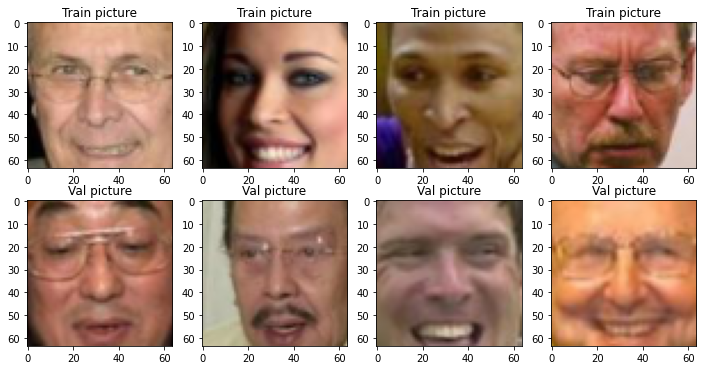

In [6]:
train, val, train_attrs, val_attrs = train_test_split(data, attrs)

X_train = torch.Tensor(train)
X_val = torch.Tensor(val)

fig, ax = plt.subplots(2, 4, figsize = (12, 6))

X_train = torch.swapaxes(X_train, 1, 3)
X_train = torch.swapaxes(X_train, 2, 3)
X_val = torch.swapaxes(X_val, 1, 3)
X_val = torch.swapaxes(X_val, 2, 3)

train_num = np.random.permutation(list(range(X_train.shape[0]+1)))[:4]
val_num = np.random.permutation(list(range(X_val.shape[0]+1)))[:4]
for i, fig_x in enumerate(ax.flatten()):
    if i < 4:
        imshow(X_train[train_num[i]], title = 'Train picture', plt_ax = fig_x)
    else:
        imshow(X_val[val_num[i-4]], title = 'Val picture', plt_ax = fig_x)    




## 1.2. Архитектура модели (1.5 балла)
В этом разделе мы напишем и обучем обычный автоэнкодер.



<img src="https://www.notion.so/image/https%3A%2F%2Fs3-us-west-2.amazonaws.com%2Fsecure.notion-static.com%2F4b8adf79-8e6a-4b7d-9061-8617a00edbb1%2F__2021-04-30__14.53.33.png?table=block&id=56f187b4-279f-4208-b1ed-4bda5f91bfc0&width=2880&userId=3b1b5e32-1cfb-4b0f-8705-5a524a8f56e3&cache=v2" alt="Autoencoder">


^ напомню, что автоэнкодер выглядит вот так

In [7]:
dim_code = 512 # выберите размер латентного вектора

Реализуем autoencoder. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Экспериментируйте!

In [8]:
from copy import deepcopy
def conv(in_channels, out_channels, kernel = 3, stride = 1, padding = 1):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel, stride, padding = padding),
        nn.ReLU()
    )
def deconv(in_channels, out_channels, kernel = 3, stride = 1, padding = 1):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding = padding),
        nn.ReLU()
    )

class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.flatten = nn.Flatten()
        self.feature_enc = nn.Sequential(
            conv(3,64),
            conv(64,64,2,2,0),
            conv(64,128),
            conv(128,128,2,2,0),
            conv(128,256),
            conv(256,128,2,2,0),
            conv(128,64)
        )
        self.linear_enc = nn.Sequential(
            nn.Linear(64*64, 1024),
            nn.ReLU(),
            nn.Linear(1024, 512),
        )

        self.linear_dec = nn.Sequential(
            nn.Linear(512, 1024),
            nn.ReLU(),
            nn.Linear(1024, 64*64),
        )

        self.feature_dec = nn.Sequential(
            deconv(64,128),
            deconv(128,256,2,2,0),
            deconv(256,128),
            deconv(128,128,2,2,0),
            deconv(128,64),
            deconv(64,64,2,2,0),
            nn.ConvTranspose2d(64,3,3,padding = 1),
            nn.Sigmoid(),
        )
        

    def forward(self, x):
        x = self.feature_enc(x)
        x = self.flatten(x)
        latent_code = self.linear_enc(x)
        x = self.linear_dec(latent_code)
        x = torch.reshape(x, (-1,64,8,8))
        reconstruction = self.feature_dec(x)
        return reconstruction, latent_code

In [9]:
summary(Autoencoder().to(device), (3,64,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           1,792
              ReLU-2           [-1, 64, 64, 64]               0
            Conv2d-3           [-1, 64, 32, 32]          16,448
              ReLU-4           [-1, 64, 32, 32]               0
            Conv2d-5          [-1, 128, 32, 32]          73,856
              ReLU-6          [-1, 128, 32, 32]               0
            Conv2d-7          [-1, 128, 16, 16]          65,664
              ReLU-8          [-1, 128, 16, 16]               0
            Conv2d-9          [-1, 256, 16, 16]         295,168
             ReLU-10          [-1, 256, 16, 16]               0
           Conv2d-11            [-1, 128, 8, 8]         131,200
             ReLU-12            [-1, 128, 8, 8]               0
           Conv2d-13             [-1, 64, 8, 8]          73,792
             ReLU-14             [-1, 6

In [10]:
criterion = nn.MSELoss()

autoencoder = Autoencoder().to(device)


In [11]:
optimizer = torch.optim.Adam(autoencoder.parameters(), lr = 4e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 50, gamma = 0.2)

In [12]:
batch_size = 256
data_tr = DataLoader(X_train, batch_size=batch_size, shuffle=True)
data_val = DataLoader(X_val,batch_size=batch_size, shuffle=True)

## 1.3 Обучение (2 балла)

Осталось написать код обучения автоэнкодера. При этом было бы неплохо в процессе иногда смотреть, как автоэнкодер реконструирует изображения на данном этапе обучения. Наример, после каждой эпохи (прогона train выборки через автоэекодер) можно смотреть, какие реконструкции получились для каких-то изображений val выборки.

А, ну еще было бы неплохо выводить графики train и val лоссов в процессе тренировки =)

In [13]:
def train(model, opt, scheduler, epochs, loss_fn, data_tr, data_val):
    x_val = next(iter(data_val))
    train_loss_history, val_loss_history = [], []
    best_val_loss = 1e9
    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))
        
        avg_loss = 0
        model.train()
        for X_batch in data_tr:
            X_batch = X_batch.to(device)
            opt.zero_grad()
            reconstruction, latent_code = model(X_batch)
            mu = latent_code.mean(axis = 0).cpu().detach().numpy()
            sigma = latent_code.std(axis = 0).cpu().detach().numpy()
            loss = loss_fn(X_batch, reconstruction)
            loss.backward()
            opt.step()
            avg_loss += loss / len(data_tr)
        scheduler.step()
        toc = time()
        train_loss_history.append(avg_loss.cpu().detach())
        print('train loss: %f' % avg_loss)

        model.eval()
        with torch.set_grad_enabled(False):
            val_reconstruction, val_latent_code = model(x_val.to(device))
            val_loss = loss_fn(x_val.cpu(), val_reconstruction.cpu())
            val_loss_history.append(val_loss)
        if val_loss < best_val_loss:
            mu = val_latent_code.mean(axis = 0).cpu().detach().numpy()
            sigma = val_latent_code.std(axis = 0).cpu().detach().numpy()
            best_val_loss = val_loss
            best_model_weights = model.state_dict()

        if epoch % 5 == 0:
            fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
            for j in range(5):
                imshow(x_val[j],title = 'True image', plt_ax = ax[0][j])
            for j in range(5):
                imshow(val_reconstruction[j].cpu(), title = 'Rec image', plt_ax = ax[1][j])

            plt.suptitle('%d / %d - val_loss: %f  ' % (epoch+1, epochs, val_loss)) 
            plt.show()  

    plt_epochs = range(1, epochs+1)
    fig, ax = plt.subplots(1,1, sharex = True)

    ax.plot(plt_epochs, train_loss_history, label = 'train loss')
    ax.plot(plt_epochs, val_loss_history, label = 'val loss')
    ax.legend()
    plt.show()
    
    model.load_state_dict(best_model_weights)
    return mu, sigma


* Epoch 1/100
train loss: 0.039043


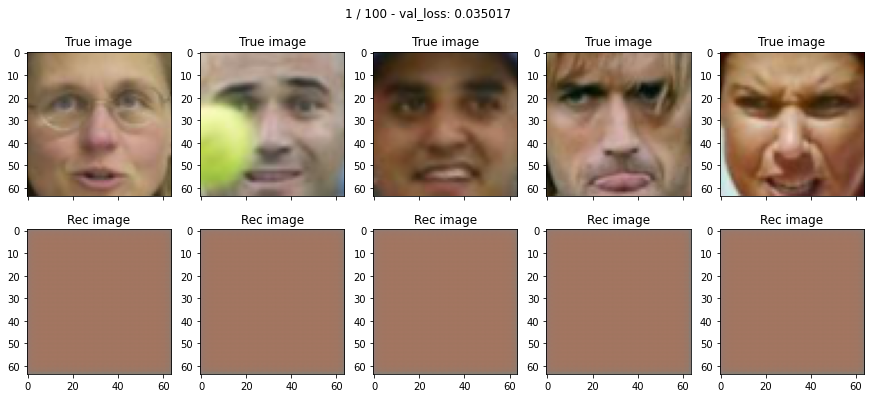

* Epoch 2/100
train loss: 0.033911
* Epoch 3/100
train loss: 0.025166
* Epoch 4/100
train loss: 0.019684
* Epoch 5/100
train loss: 0.016064
* Epoch 6/100
train loss: 0.013583


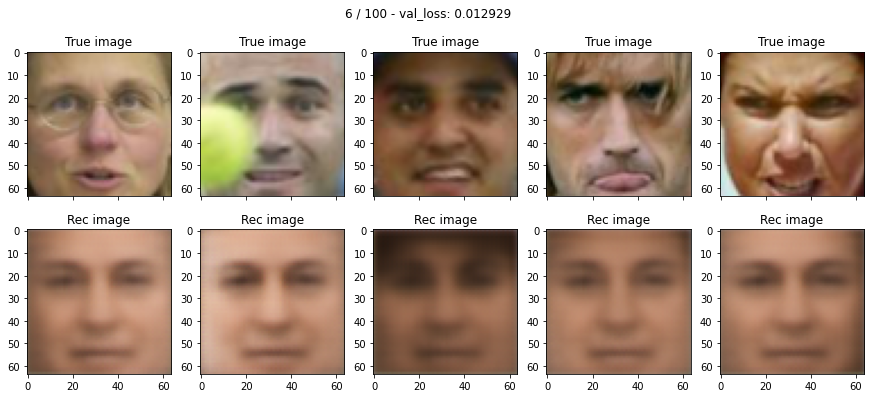

* Epoch 7/100
train loss: 0.012851
* Epoch 8/100
train loss: 0.012408
* Epoch 9/100
train loss: 0.011221
* Epoch 10/100
train loss: 0.010468
* Epoch 11/100
train loss: 0.010060


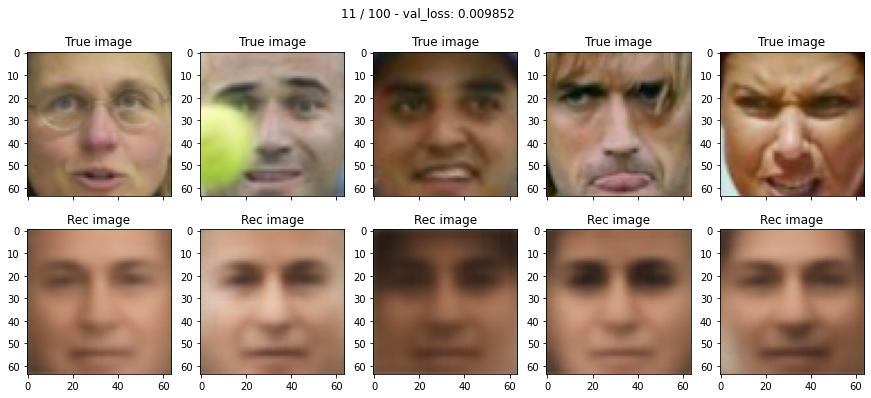

* Epoch 12/100
train loss: 0.009720
* Epoch 13/100
train loss: 0.009555
* Epoch 14/100
train loss: 0.009061
* Epoch 15/100
train loss: 0.008802
* Epoch 16/100
train loss: 0.009009


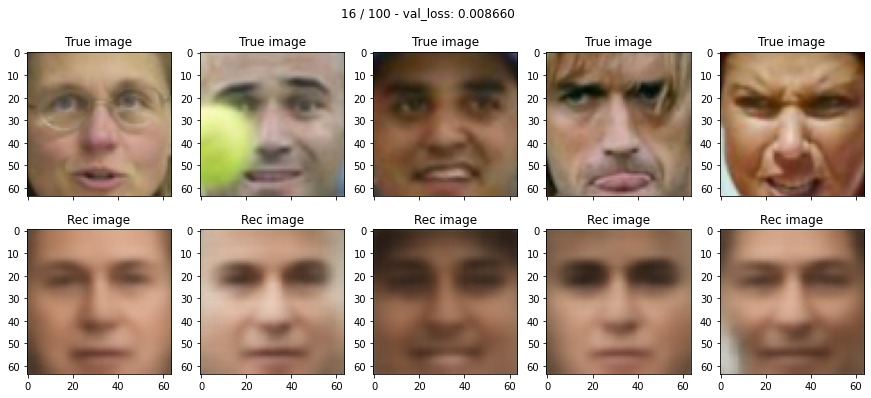

* Epoch 17/100
train loss: 0.008353
* Epoch 18/100
train loss: 0.008133
* Epoch 19/100
train loss: 0.007454
* Epoch 20/100
train loss: 0.007035
* Epoch 21/100
train loss: 0.007175


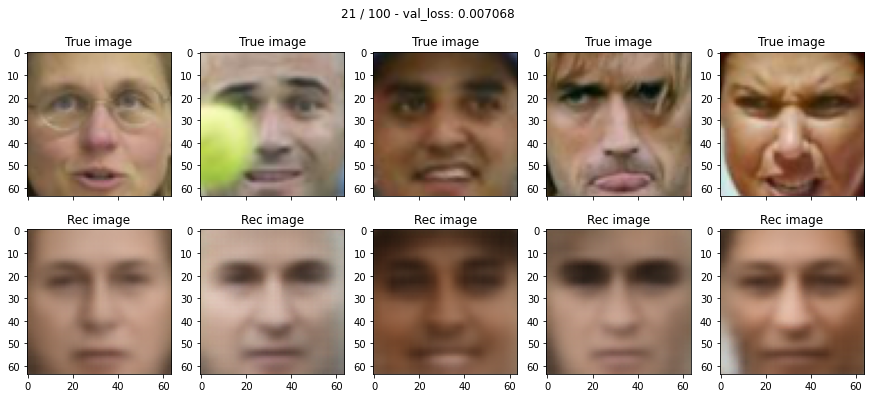

* Epoch 22/100
train loss: 0.006610
* Epoch 23/100
train loss: 0.006524
* Epoch 24/100
train loss: 0.006293
* Epoch 25/100
train loss: 0.006112
* Epoch 26/100
train loss: 0.006027


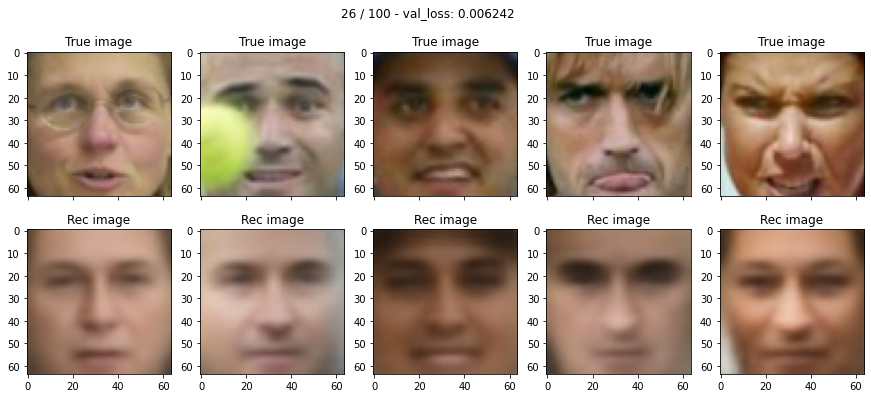

* Epoch 27/100
train loss: 0.005967
* Epoch 28/100
train loss: 0.005766
* Epoch 29/100
train loss: 0.005866
* Epoch 30/100
train loss: 0.005507
* Epoch 31/100
train loss: 0.005415


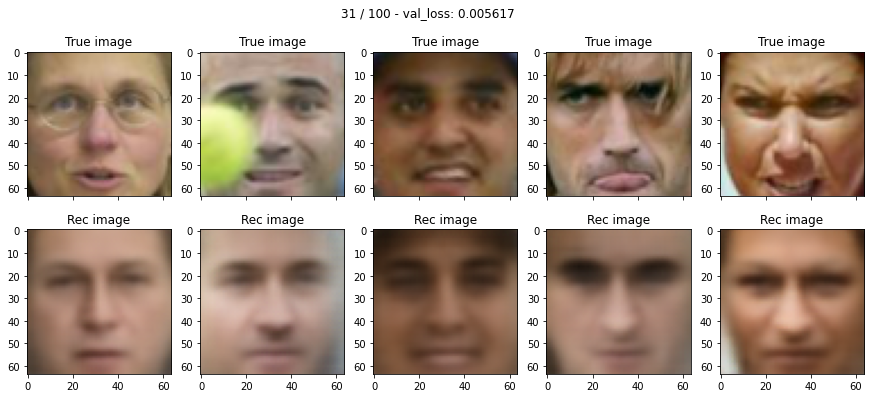

* Epoch 32/100
train loss: 0.005453
* Epoch 33/100
train loss: 0.005167
* Epoch 34/100
train loss: 0.005098
* Epoch 35/100
train loss: 0.004964
* Epoch 36/100
train loss: 0.005012


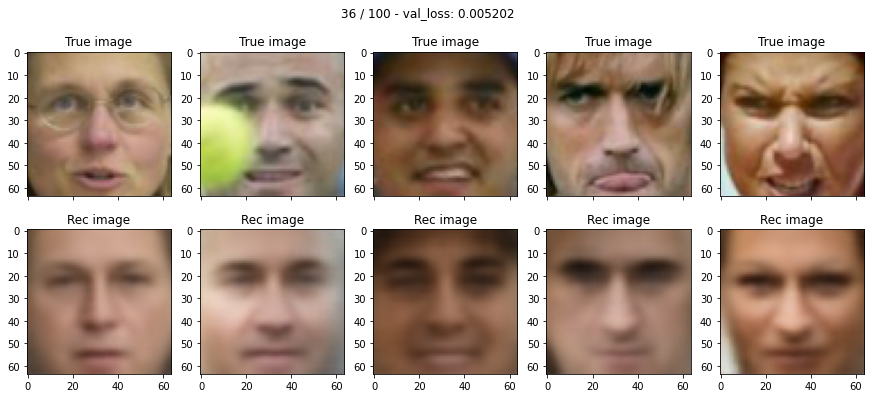

* Epoch 37/100
train loss: 0.004806
* Epoch 38/100
train loss: 0.004808
* Epoch 39/100
train loss: 0.004718
* Epoch 40/100
train loss: 0.004605
* Epoch 41/100
train loss: 0.004614


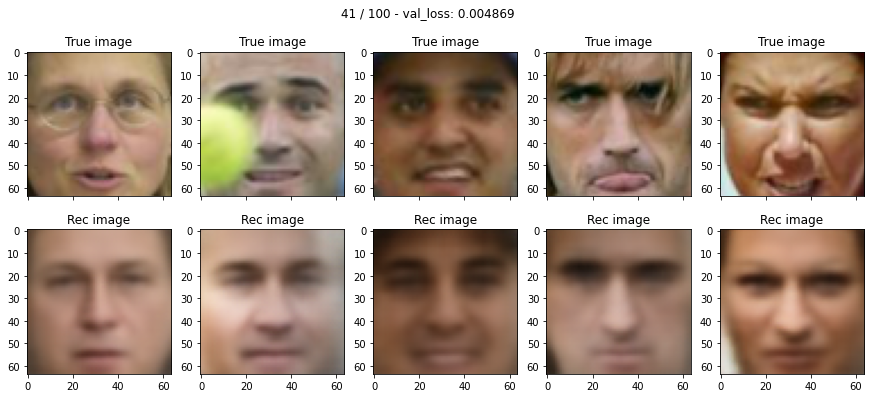

* Epoch 42/100
train loss: 0.004642
* Epoch 43/100
train loss: 0.004412
* Epoch 44/100
train loss: 0.004367
* Epoch 45/100
train loss: 0.004339
* Epoch 46/100
train loss: 0.004225


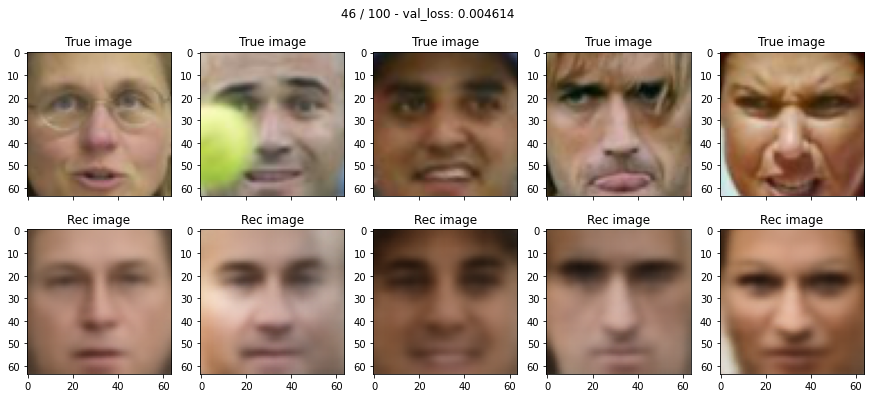

* Epoch 47/100
train loss: 0.004213
* Epoch 48/100
train loss: 0.004132
* Epoch 49/100
train loss: 0.004108
* Epoch 50/100
train loss: 0.003996
* Epoch 51/100
train loss: 0.003844


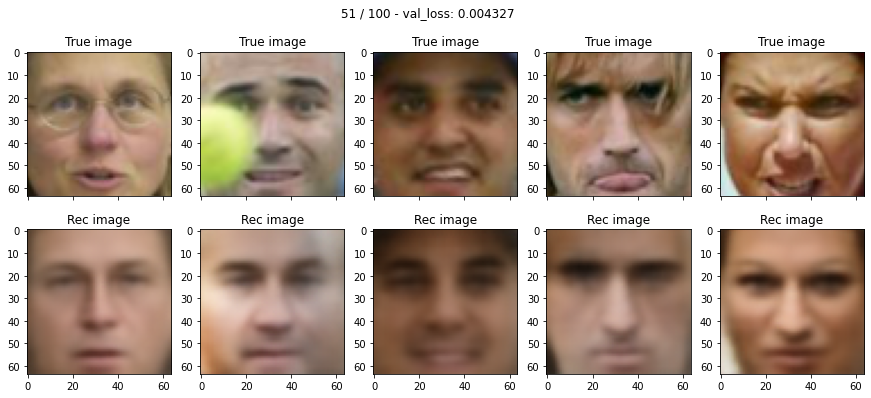

* Epoch 52/100
train loss: 0.003800
* Epoch 53/100
train loss: 0.003784
* Epoch 54/100
train loss: 0.003774
* Epoch 55/100
train loss: 0.003755
* Epoch 56/100
train loss: 0.003740


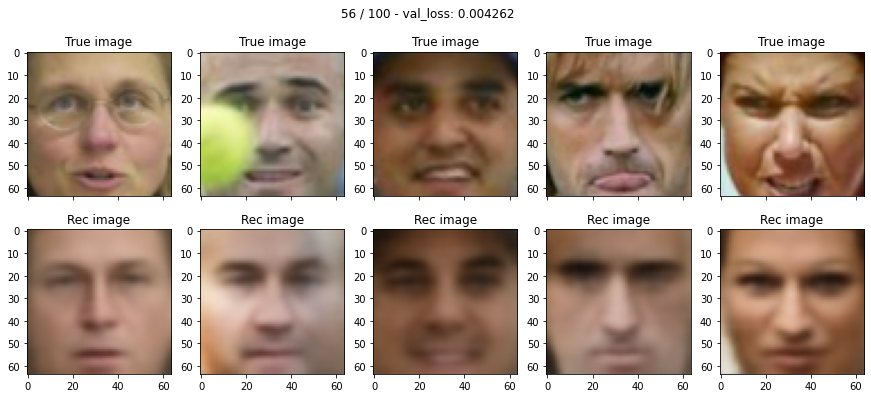

* Epoch 57/100
train loss: 0.003726
* Epoch 58/100
train loss: 0.003713
* Epoch 59/100
train loss: 0.003698
* Epoch 60/100
train loss: 0.003685
* Epoch 61/100
train loss: 0.003666


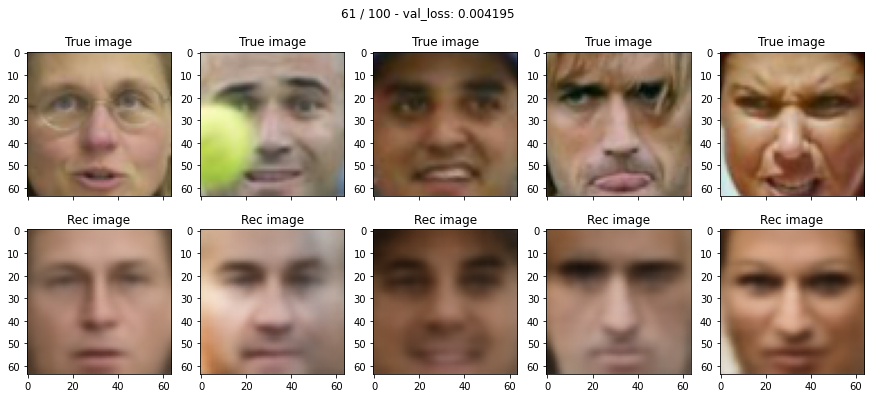

* Epoch 62/100
train loss: 0.003648
* Epoch 63/100
train loss: 0.003637
* Epoch 64/100
train loss: 0.003623
* Epoch 65/100
train loss: 0.003610
* Epoch 66/100
train loss: 0.003593


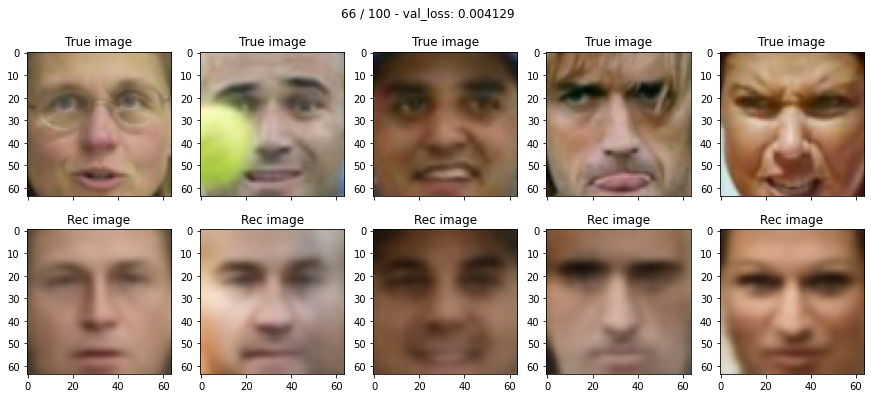

* Epoch 67/100
train loss: 0.003576
* Epoch 68/100
train loss: 0.003562
* Epoch 69/100
train loss: 0.003545
* Epoch 70/100
train loss: 0.003533
* Epoch 71/100
train loss: 0.003517


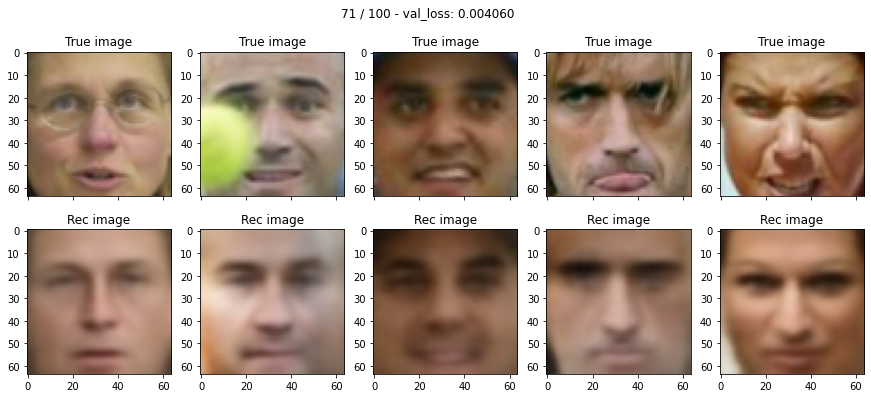

* Epoch 72/100
train loss: 0.003502
* Epoch 73/100
train loss: 0.003490
* Epoch 74/100
train loss: 0.003473
* Epoch 75/100
train loss: 0.003456
* Epoch 76/100
train loss: 0.003439


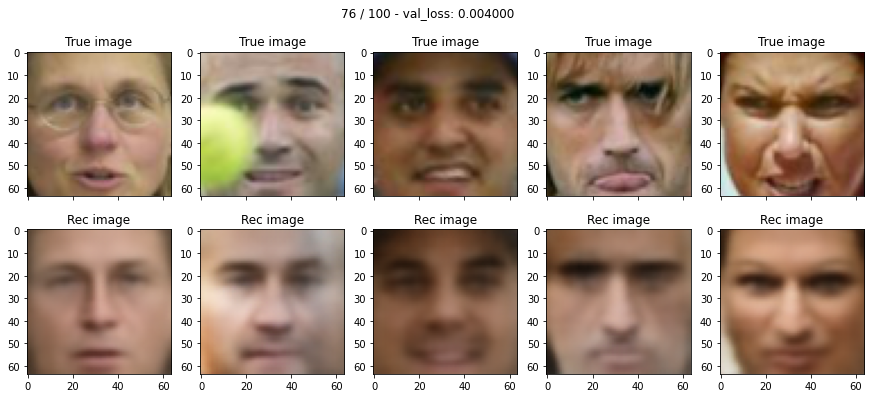

* Epoch 77/100
train loss: 0.003428
* Epoch 78/100
train loss: 0.003412
* Epoch 79/100
train loss: 0.003396
* Epoch 80/100
train loss: 0.003382
* Epoch 81/100
train loss: 0.003365


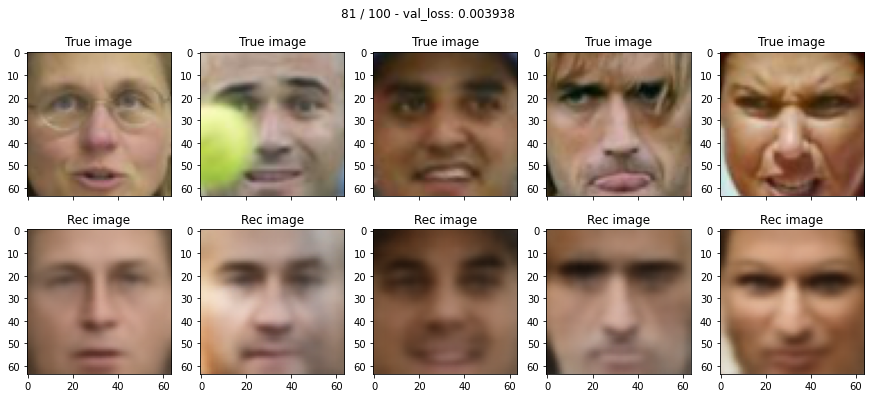

* Epoch 82/100
train loss: 0.003355
* Epoch 83/100
train loss: 0.003337
* Epoch 84/100
train loss: 0.003322
* Epoch 85/100
train loss: 0.003310
* Epoch 86/100
train loss: 0.003294


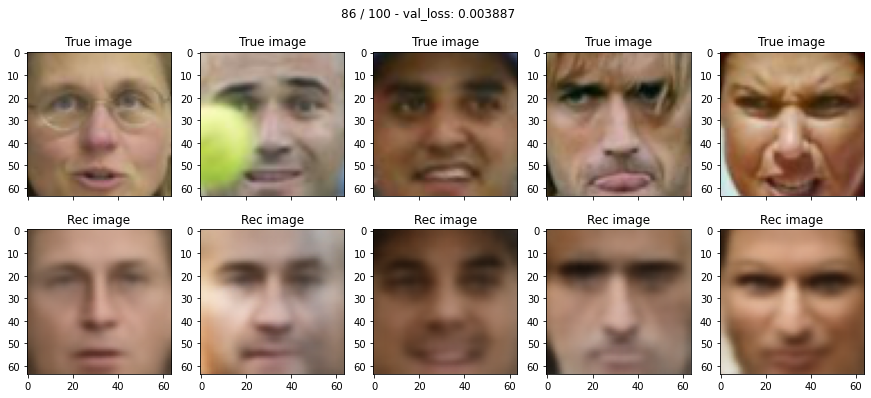

* Epoch 87/100
train loss: 0.003281
* Epoch 88/100
train loss: 0.003270
* Epoch 89/100
train loss: 0.003254
* Epoch 90/100
train loss: 0.003239
* Epoch 91/100
train loss: 0.003228


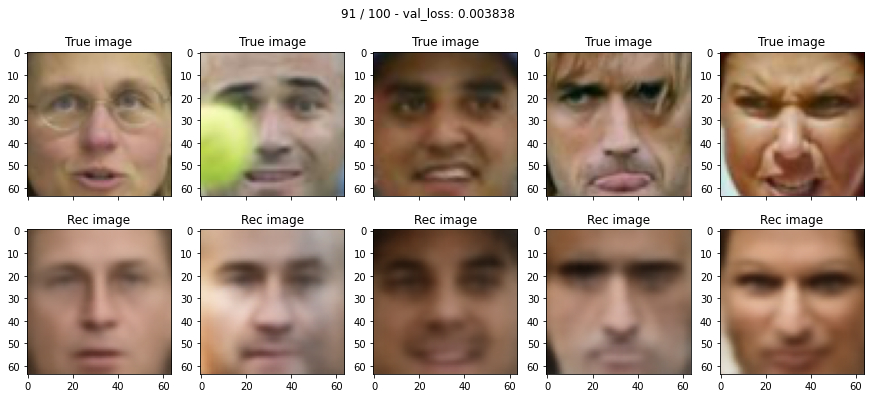

* Epoch 92/100
train loss: 0.003214
* Epoch 93/100
train loss: 0.003197
* Epoch 94/100
train loss: 0.003184
* Epoch 95/100
train loss: 0.003174
* Epoch 96/100
train loss: 0.003161


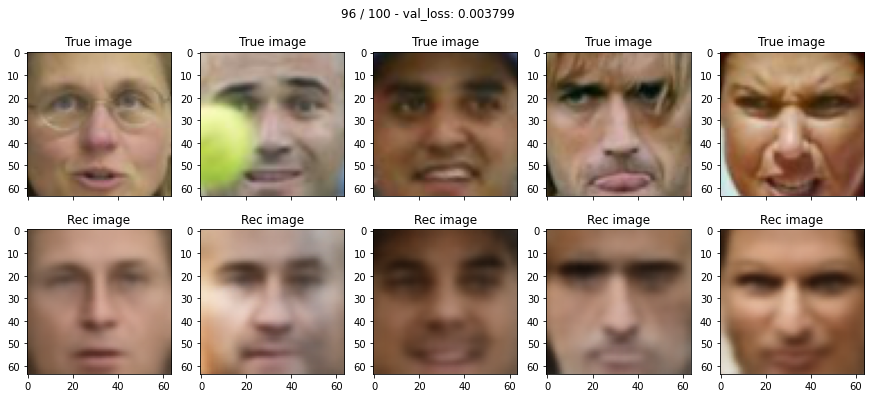

* Epoch 97/100
train loss: 0.003148
* Epoch 98/100
train loss: 0.003129
* Epoch 99/100
train loss: 0.003115
* Epoch 100/100
train loss: 0.003109


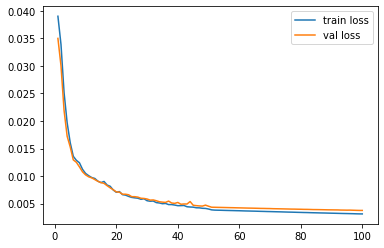

In [14]:
mu, sigma = train(autoencoder,optimizer, scheduler, 100, criterion, data_tr, data_val)

In [ ]:
print(mu) 
print(sigma)

[ 8.52155030e-01  4.43971992e-01 -5.19016385e-01 -4.12323618e+00
 -1.17419338e+00 -2.68619180e-01 -8.44150111e-02 -1.71292233e+00
  2.26927519e+00 -2.62353607e-02 -2.78994417e+00 -7.23935485e-01
  1.31687805e-01 -1.59505367e+00 -2.92291582e-01  5.30445576e-01
 -3.33447456e-01  4.08081971e-02  2.50599909e+00  4.43639278e-01
 -8.66761804e-02  1.31535351e-01  7.38388821e-02  1.00459501e-01
  1.66925341e-01  3.93090630e+00 -3.33706975e-01 -2.36732960e+00
  2.90717240e-02 -4.85534132e-01  5.44189453e-01 -3.00088942e-01
  5.70409715e-01 -1.52844274e+00  2.14081466e-01  1.98317803e-02
  5.36342025e-01  3.66125673e-01 -2.69663334e-01 -1.91011071e+00
  3.28263855e+00 -1.16412210e+00  1.90810072e+00  1.23674750e+00
 -5.60190260e-01 -1.21954933e-01  2.42672968e+00  2.46266186e-01
  2.03175306e-01  2.56129950e-02  1.31304607e-01  4.40150052e-01
  7.36508131e-01 -1.13019742e-01 -7.92899728e-01  1.42587340e+00
 -1.49906826e+00 -3.46717775e-01 -6.41139567e-01  4.75443792e+00
 -3.72053236e-01 -4.71102

Давайте посмотрим, как наш тренированный автоэекодер кодирует и восстанавливает картинки:

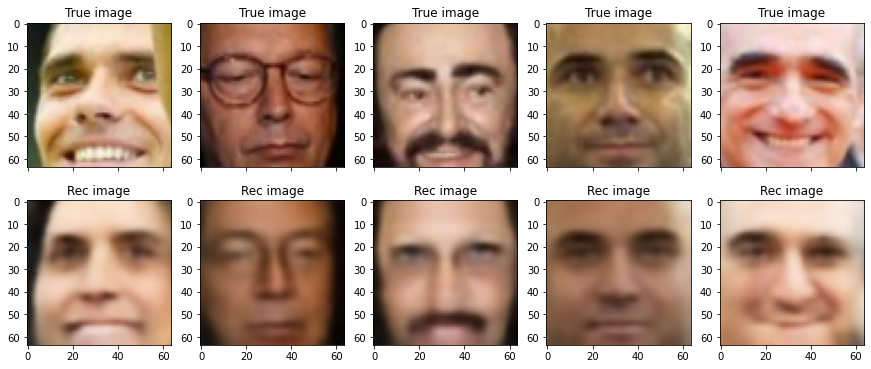

In [ ]:
autoencoder.eval()
with torch.set_grad_enabled(False):
    val_reconstruction, val_latent_code = autoencoder(X_val[:5].to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    imshow(X_val[j],title = 'True image', plt_ax = ax[0][j])
for j in range(5):
    imshow(val_reconstruction[j].cpu(), title = 'Rec image', plt_ax = ax[1][j])
plt.show() 

Not bad, right? 

## 1.4. Sampling (2 балла)

Давайте теперь будем не просто брать картинку, прогонять ее через автоэекодер и получать реконструкцию, а попробуем создать что-то НОВОЕ

Давайте возьмем и подсунем декодеру какие-нибудь сгенерированные нами векторы (например, из нормального распределения) и посмотрим на результат реконструкции декодера:

__Подсказка:__Е сли вместо лиц у вас выводится непонятно что, попробуйте посмотреть, как выглядят латентные векторы картинок из датасета. Так как в обучении нейронных сетей есть определенная доля рандома, векторы латентного слоя могут быть распределены НЕ как `np.random.randn(25, <latent_space_dim>)`. А чтобы у нас получались лица при запихивании вектора декодеру, вектор должен быть распределен так же, как латентные векторы реальных фоток. Так что в таком случае придется рандом немного подогнать.

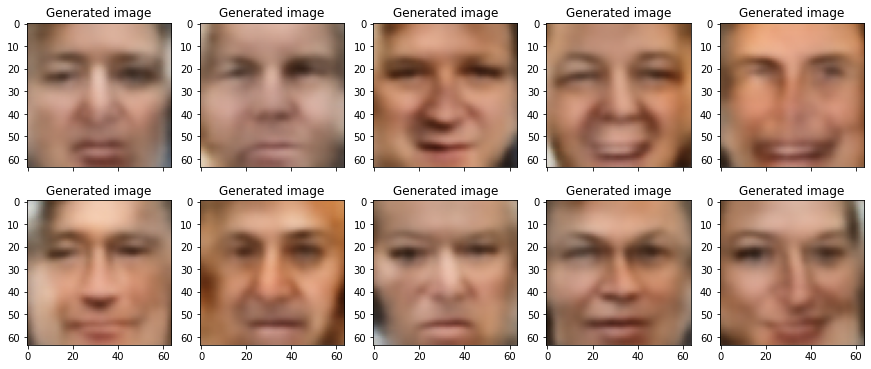

In [ ]:
autoencoder.eval()
with torch.set_grad_enabled(False):
    eps = torch.randn((25,512))
    sample = eps*(1.8*sigma)+mu
    img = autoencoder.linear_dec(sample.to(device))
    unf = nn.Unflatten(1, (64,8,8))
    img = unf(img)
    img = autoencoder.feature_dec(img)

fig,ax = plt.subplots(2,5, figsize = (15,6), sharex = True)
for j in range(5):
    imshow(img[j].cpu(), title = 'Generated image', plt_ax = ax[0][j])
for j in range(5):
    imshow(img[j+5].cpu(), title = 'Generated image', plt_ax = ax[1][j])
plt.show()

## Time to make fun! (4 балла)

Давайте научимся пририсовывать людям улыбки =)

<img src="https://i.imgur.com/tOE9rDK.png" alt="linear" width="700" height="400">

План такой:

1. Нужно выделить "вектор улыбки": для этого нужно из выборки изображений найти несколько (~15) людей с улыбками и столько же без.

Найти людей с улыбками вам поможет файл с описанием датасета, скачанный вместе с датасетом. В нем указаны имена картинок и присутствубщие атрибуты (улыбки, очки...)

2. Вычислить латентный вектор для всех улыбающихся людей (прогнать их через encoder) и то же для всех грустненьких

3. Вычислить, собственно, вектор улыбки -- посчитать разность между средним латентным вектором улыбающихся людей и средним латентным вектором грустных людей

4. А теперь приделаем улыбку грустному человеку: добавим полученный в пункте 3 вектор к латентному вектору грустного человека и прогоним полученный вектор через decoder. Получим того же человека, но уже не грустненького!

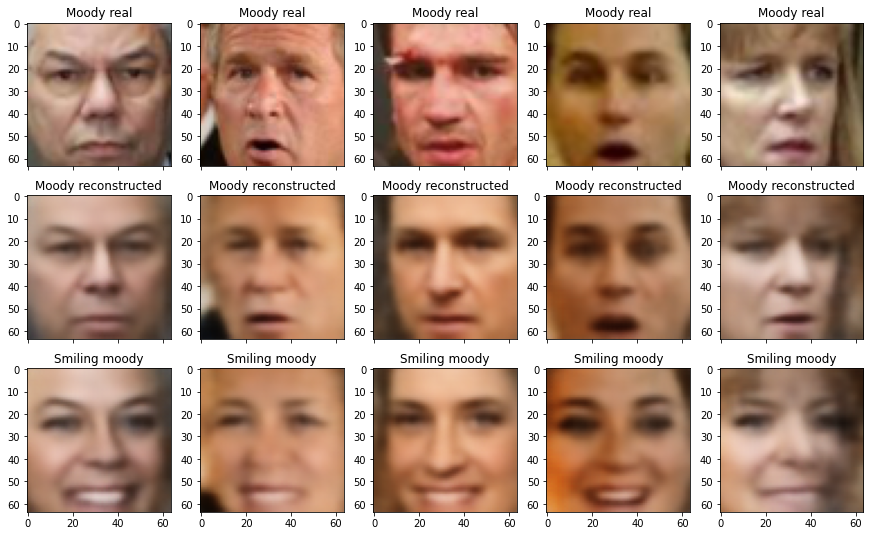

In [ ]:
smile_faces = train_attrs['Smiling'] > 2.0
smile_faces = X_train[smile_faces.values]
smile_faces = smile_faces[random.sample(range(0, len(smile_faces)), 20)]
moody_faces = train_attrs['Smiling'] < -2.0
moody_faces = X_train[moody_faces.values]
moody_faces = moody_faces[random.sample(range(0, len(moody_faces)), 20)]
autoencoder.eval()
with torch.set_grad_enabled(False):
    smile_rec, smile_vectors = autoencoder(smile_faces.to(device))
    moody_rec, moody_vectors = autoencoder(moody_faces.to(device))

smile_center = smile_vectors.mean(axis = 0)
moody_center = moody_vectors.mean(axis = 0)
funny_maker = smile_center - moody_center

funny_moody = moody_vectors + funny_maker

funny_moody_img = autoencoder.linear_dec(funny_moody.to(device))
unf = nn.Unflatten(1, (64,8,8))
funny_moody_img = unf(funny_moody_img)
funny_moody_img = autoencoder.feature_dec(funny_moody_img)





fig,ax = plt.subplots(3,5, figsize = (15,9), sharex = True)
for j in range(5):
    imshow(moody_faces[j].cpu(), title = 'Moody real', plt_ax = ax[0][j])
for j in range(5):
    imshow(moody_rec[j].cpu(), title = 'Moody reconstructed', plt_ax = ax[1][j])
for j in range(5):
    imshow(funny_moody_img[j].cpu(), title = 'Smiling moody', plt_ax = ax[2][j])

plt.show()

In [ ]:
def attr_to_image(attr):
    plus_faces = train_attrs[attr] > 2.0
    plus_faces = X_train[plus_faces.values]
    plus_faces = plus_faces[random.sample(range(0, len(plus_faces)), min(20, len(plus_faces)))]
    minus_faces = train_attrs[attr] < -2.0
    minus_faces = X_train[minus_faces.values]
    minus_faces = minus_faces[random.sample(range(0, len(minus_faces)), min(20, len(minus_faces)))]
    autoencoder.eval()
    with torch.set_grad_enabled(False):
        plus_rec, plus_vectors = autoencoder(plus_faces.to(device))
        minus_rec, minus_vectors = autoencoder(minus_faces.to(device))

    plus_center = plus_vectors.mean(axis = 0)
    minus_center = minus_vectors.mean(axis = 0)
    plus_maker = plus_center - minus_center

    plus_minus = minus_vectors + plus_maker

    plus_minus_img = autoencoder.linear_dec(plus_minus.to(device))
    unf = nn.Unflatten(1, (64,8,8))
    plus_minus_img = unf(plus_minus_img)
    plus_minus_img = autoencoder.feature_dec(plus_minus_img)





    fig,ax = plt.subplots(3,5, figsize = (15,9), sharex = True)
    plt.title(f'Adding attribute {attr}')
    for j in range(5):
        imshow(minus_faces[j].cpu(), title = 'Real Before', plt_ax = ax[0][j])
    for j in range(5):
        imshow(minus_rec[j].cpu(), title = 'Rec before', plt_ax = ax[1][j])
    for j in range(5):
        imshow(plus_minus_img[j].cpu(), title = f'Rec + {attr}', plt_ax = ax[2][j])


    plt.show()


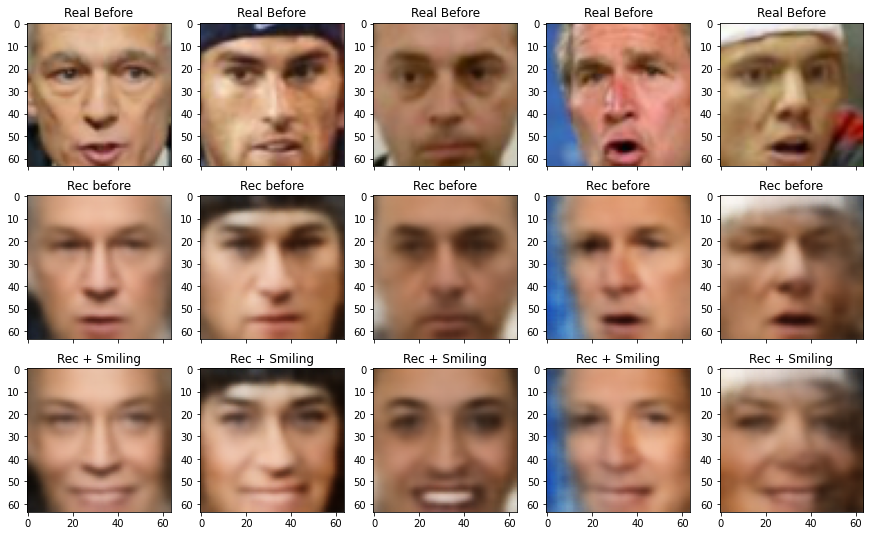

In [ ]:
attr_to_image('Smiling')

In [ ]:
attrs

,Male,Asian,White,Black,Baby,Child,Youth,Middle Aged,Senior,Black Hair,Blond Hair,Brown Hair,Bald,No Eyewear,Eyeglasses,Sunglasses,Mustache,Smiling,Frowning,Chubby,Blurry,Harsh Lighting,Flash,Soft Lighting,Outdoor,Curly Hair,Wavy Hair,Straight Hair,Receding Hairline,Bangs,Sideburns,Fully Visible Forehead,Partially Visible Forehead,Obstructed Forehead,Bushy Eyebrows,Arched Eyebrows,Narrow Eyes,Eyes Open,Big Nose,Pointy Nose,Big Lips,Mouth Closed,Mouth Slightly Open,Mouth Wide Open,Teeth Not Visible,No Beard,Goatee,Round Jaw,Double Chin,Wearing Hat,Oval Face,Square Face,Round Face,Color Photo,Posed Photo,Attractive Man,Attractive Woman,Indian,Gray Hair,Bags Under Eyes,Heavy Makeup,Rosy Cheeks,Shiny Skin,Pale Skin,5 o' Clock Shadow,Strong Nose-Mouth Lines,Wearing Lipstick,Flushed Face,High Cheekbones,Brown Eyes,Wearing Earrings,Wearing Necktie,Wearing Necklace
0,1.56835,-1.88904,1.7372,-0.929729,-1.4718,-0.19558,-0.835609,-0.351468,-1.01253,-0.719593,-0.632401,0.464839,-0.973528,1.56519,-1.2967,-1.54272,-0.684671,-0.86499,0.766886,-0.218952,-1.65567,-0.787044,-0.599665,0.458519,0.18976,0.851555,-0.38572,-0.497719,-0.161149,-0.257514,-0.0888388,0.455469,-0.839211,-0.0229481,-0.922568,-0.114539,1.46122,1.75848,0.0688935,1.26786,-1.12024,0.917617,-1.30796,-1.50041,1.02922,0.832363,-0.498657,0.251365,-0.705281,-0.515715,0.374239,-0.168675,-0.614143,3.0977,1.52386,0.779278,-0.0714539,-1.24648,-0.769283,-0.725597,-1.82061,-2.07298,-0.960759,0.361738,1.16612,-1.16492,-1.13999,-2.37175,-1.29993,-0.414682,-1.1449,0.694007,-0.826609
1,0.169851,-0.982408,0.422709,-1.28218,-1.36006,-0.867002,-0.452293,-0.197521,-0.956073,-0.802107,-0.736883,0.294554,-1.27765,0.954771,-0.990992,-1.16736,-0.835146,0.798544,-0.971679,0.342826,-1.32256,0.962937,-1.19936,-0.157307,0.443224,-0.00288156,-0.0211584,-0.226563,-0.0810386,-0.827202,-0.106624,1.22759,-0.812223,-1.24126,0.0962725,-0.404544,0.325919,0.474452,1.13536,0.0587247,0.611176,-1.17251,0.428512,-0.874235,-1.19156,0.192359,-0.204166,0.342347,0.239512,-1.47469,0.236057,-0.565208,-0.712542,2.99708,-0.273306,-0.187722,-0.604608,-1.3217,-0.938559,0.494294,-0.659043,-1.14375,-0.775722,-0.832036,-0.39768,0.87416,-0.945431,-0.268649,-0.00624408,-0.0304057,-0.480128,0.66676,-0.496559
2,0.997749,-1.36419,-0.157377,-0.756447,-1.89183,-0.871526,-0.862893,0.0314447,-1.34152,-0.0900375,-1.20073,-0.33246,-0.537006,1.29836,-1.49847,-1.28582,1.14174,0.172817,0.106412,-0.788843,0.349295,-1.64372,0.454287,1.18946,-0.688414,-0.590574,-0.266673,0.467224,0.567348,-1.7191,0.124667,1.60274,-0.659399,-1.75376,1.20447,0.0221884,-1.13544,1.70286,-0.422144,0.587859,0.414363,0.344447,-1.26045,-0.577746,0.405567,-1.91655,0.92126,0.247437,-0.428451,-0.772273,0.370673,-0.509596,-0.768482,1.7069,0.126524,-0.497001,-0.393042,-0.178307,-1.18023,-0.596914,-1.80538,-0.951643,-0.838087,1.54974,1.88475,-0.999765,-1.35986,-1.91211,-1.09563,0.915126,-0.572332,0.144262,-0.841231
3,1.12272,-1.9978,1.91614,-2.51421,-2.58007,-1.40424,0.0575511,0.000195882,-1.27351,-1.43146,-0.0705188,-0.339239,-2.00415,0.665695,-0.77594,-1.47163,-1.17908,0.563327,-0.664429,-1.40793,0.435594,-0.589988,-1.6035,1.17074,0.760103,0.211498,-0.51618,-1.33115,0.20284,0.149645,-0.0464296,0.640885,-0.107616,-0.831271,-0.827005,-0.588725,0.429255,1.58766,0.499086,-0.0568692,-0.866643,-0.959689,0.35073,-1.33535,-0.42789,0.826817,-0.256779,0.149751,-1.20153,-1.08392,0.255363,-0.650423,-0.506293,1.10159,0.640783,1.57503,-0.484397,-1.55968,-1.43712,0.379363,-0.648233,-2.25735,-1.07561,0.567822,-0.176089,1.10812,-1.60094,-3.26461,0.813418,0.308631,-0.848693,0.475941,-0.447025
4,1.07821,-2.0081,1.67621,-2.27806,-2.65185,-1.34841,0.649089,0.0176564,-1.88911,-1.85721,-0.568057,0.840375,-1.98127,1.66671,-0.910723,-1.99351,-0.871335,0.507786,-0.488947,-0.88649,-0.990132,-0.750813,-0.378479,0.583086,-1.4796,0.250185,-0.381123,-0.611991,-0.143091,-1.07276,0.432094,1.08919,-0.470929,-1.17712,-0.111313,-0.154603,-1.03151,2.39246,-0.191576,1.2279,-1.3818,-1.52885,0.907964,-1.32429,-0

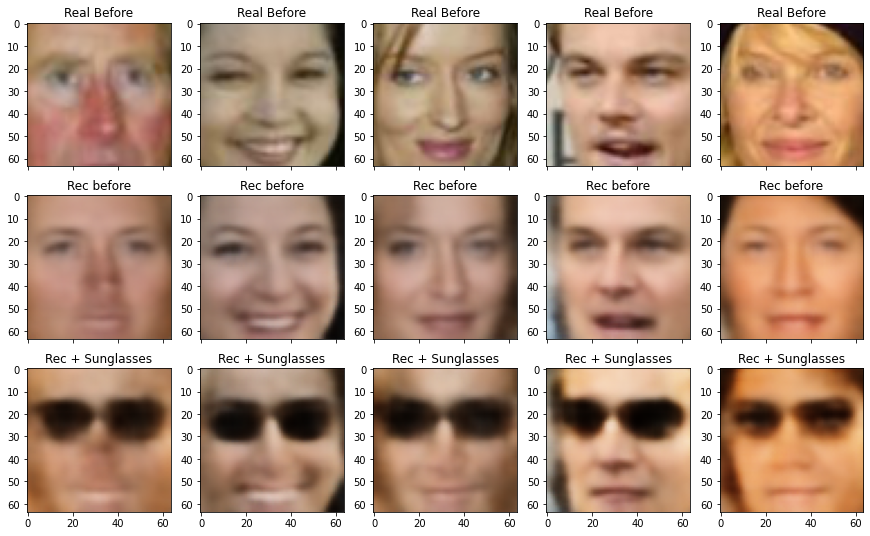

In [ ]:
attr_to_image('Sunglasses')

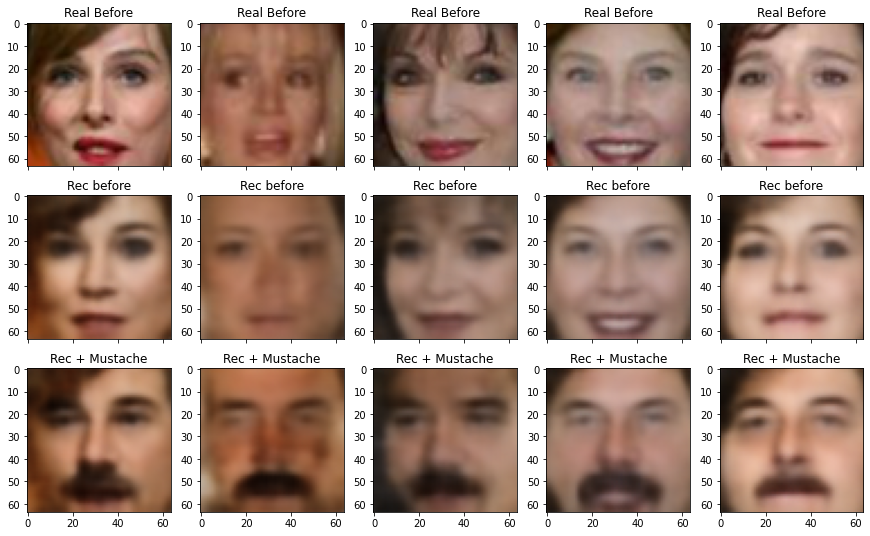

In [ ]:
attr_to_image('Mustache')

Вуаля! Вы восхитительны!

Теперь вы можете пририсовывать людям не только улыбки, но и много чего другого -- закрывать/открывать глаза, пририсовывать очки... в общем, все, на что хватит фантазии и на что есть атрибуты в `all_attrs`:)

# Часть 2: Variational Autoencoder (10 баллов) 

Займемся обучением вариационных автоэнкодеров — проапгрейженной версии AE. Обучать будем на датасете MNIST, содержащем написанные от руки цифры от 0 до 9

In [ ]:
batch_size = 64
# MNIST Dataset
from torchvision import transforms
train_dataset = datasets.MNIST(root='./mnist_data/', train=True, transform=transforms.ToTensor(), download=True)
test_dataset = datasets.MNIST(root='./mnist_data/', train=False, transform=transforms.ToTensor(), download=False)

# Data Loader (Input Pipeline)
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)


Extracting ./mnist_data/MNIST/raw/train-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw




Extracting ./mnist_data/MNIST/raw/train-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./mnist_data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./mnist_data/MNIST/raw




Extracting ./mnist_data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./mnist_data/MNIST/raw

Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:502: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
next(iter(train_loader))[1].shape

torch.Size([64])

## 2.1 Архитектура модели и обучение (2 балла)

Реализуем VAE. Архитектуру (conv, fully-connected, ReLu, etc) можете выбирать сами. Рекомендуем пользоваться более сложными моделями, чем та, что была на семинаре:) Экспериментируйте!

In [ ]:
def conv(in_channels, out_channels, kernel = 3, stride = 1, padding = 0):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel, stride, padding = padding),
        nn.ReLU()
    )
def deconv(in_channels, out_channels, kernel = 3, stride = 1, padding = 0):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding = padding),
        nn.Sigmoid()
    )

features = 16

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (3,24,24))

        self.feature_enc = conv(1,3,5)

        self.linear_enc = nn.Sequential(
            nn.Linear(3*24*24,256),
            nn.ReLU(),
            nn.Linear(256,64),
            nn.ReLU(),
            nn.Linear(64, features*2),
        )
        self.linear_dec = nn.Sequential(
            nn.Linear(features, 64),
            nn.ReLU(),
            nn.Linear(64,256),
            nn.ReLU(),
            nn.Linear(256,3*24*24),
        )
        self.feature_dec = deconv(3,1,5)

    def encode(self, x):
        x = self.feature_enc(x)
        x = self.flatten(x)
        x = self.linear_enc(x).view(-1,2,features)
        mu = x[:,0,:]
        logsigma = x[:,1,:]
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        std = torch.exp(0.5*logsigma)
        
        if self.training:
            eps = torch.randn(features).to(device)
            latent_vector = mu + eps*std
            #print('latent_vector shape =', latent_vector.shape)
            return latent_vector
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu. 
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu
    
    def decode(self, z):
        z = self.linear_dec(z)
        z = self.unflatten(z)
        reconstruction = self.feature_dec(z)
        return reconstruction

    def forward(self, x):
        mu, logsigma = self.encode(x)
        x = self.gaussian_sampler(mu, logsigma)
        reconstruction = self.decode(x)    
        return mu, logsigma, reconstruction

Определим лосс и его компоненты для VAE:

Надеюсь, вы уже прочитали материал в towardsdatascience (или еще где-то) про VAE и знаете, что лосс у VAE состоит из двух частей: KL и log-likelihood.

Общий лосс будет выглядеть так:

$$\mathcal{L} = -D_{KL}(q_{\phi}(z|x)||p(z)) + \log p_{\theta}(x|z)$$

Формула для KL-дивергенции:

$$D_{KL} = -\frac{1}{2}\sum_{i=1}^{dimZ}(1+log(\sigma_i^2)-\mu_i^2-\sigma_i^2)$$

В качестве log-likelihood возьмем привычную нам кросс-энтропию.

In [ ]:
def KL_divergence(mu, logsigma):
    """
    часть функции потерь, которая отвечает за "близость" латентных представлений разных людей
    """
    loss = -0.5 * torch.sum(1 + logsigma - mu.pow(2) - torch.exp(logsigma))
    return loss

def log_likelihood(x, reconstruction):
    """
    часть функции потерь, которая отвечает за качество реконструкции
    """
    loss = nn.BCELoss(reduction='sum')
    return loss(reconstruction, x)

def loss_vae(x, mu, logsigma, reconstruction):
    return KL_divergence(mu, logsigma) + log_likelihood(x, reconstruction)

И обучим модель:

In [ ]:
criterion = loss_vae

autoencoder = VAE()

In [ ]:
summary(autoencoder.to(device), (1,28,28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 3, 24, 24]              78
              ReLU-2            [-1, 3, 24, 24]               0
           Flatten-3                 [-1, 1728]               0
            Linear-4                  [-1, 256]         442,624
              ReLU-5                  [-1, 256]               0
            Linear-6                   [-1, 64]          16,448
              ReLU-7                   [-1, 64]               0
            Linear-8                   [-1, 32]           2,080
            Linear-9                   [-1, 64]           1,088
             ReLU-10                   [-1, 64]               0
           Linear-11                  [-1, 256]          16,640
             ReLU-12                  [-1, 256]               0
           Linear-13                 [-1, 1728]         444,096
        Unflatten-14            [-1, 3,

In [ ]:
optimizer = torch.optim.Adam(autoencoder.parameters(), lr = 4e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 50, gamma = 0.2)

In [ ]:
def vae_train(model, opt, scheduler, epochs, loss_fn, data_tr, data_val):
    x_val = next(iter(data_val))[0]
    train_loss_history, val_loss_history = [], []
    best_val_loss = 1e9
    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))
        
        avg_loss = 0
        model.train()
        for X_batch in data_tr:
            X_batch = X_batch[0].to(device)
            opt.zero_grad()
            mu, logsigma, reconstruction = model(X_batch)
            loss = loss_fn(X_batch, mu, logsigma,  reconstruction)
            loss.backward()
            opt.step()
            avg_loss += loss / len(data_tr)
        scheduler.step()
        toc = time()
        train_loss_history.append(avg_loss)
        print('train loss: %f' % avg_loss)

        model.eval()
        with torch.set_grad_enabled(False):
            val_mu, val_logsigma, val_reconstruction = model(x_val.to(device))
            val_loss = loss_fn(x_val.cpu(), val_mu.cpu(), val_logsigma.cpu(), val_reconstruction.cpu())
            val_loss_history.append(val_loss)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_weights = model.state_dict()

        fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
        for j in range(5):
            ax[0][j].imshow(x_val[j].squeeze(), cmap ='gray')

        for j in range(5):
            ax[1][j].imshow(val_reconstruction[j].cpu().squeeze(), cmap = 'gray')

        plt.suptitle('%d / %d - val_loss: %f  ' % (epoch+1, epochs, val_loss)) 
        plt.show()  
        for param in model.parameters():
            #print('param is:',param)
            #print('grad of param:', param.grad)
            break
    plt_epochs = range(1, epochs+1)
    fig, ax = plt.subplots(1,2, sharex = True)

    ax[0].plot(plt_epochs, train_loss_history, label = 'train loss')
    ax[0].plot(plt_epochs, val_loss_history, label = 'val loss')
    ax[0].legend()
    ax[1].legend()
    plt.show()
    
    model.load_state_dict(best_model_weights)


* Epoch 1/50
train loss: 13689.377930


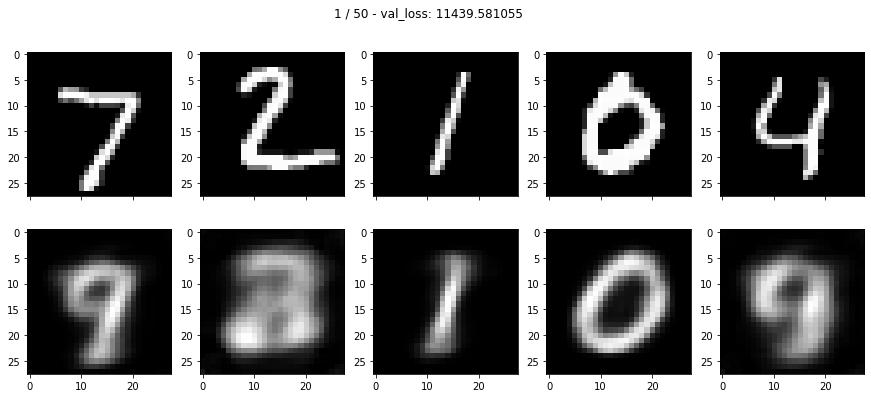

* Epoch 2/50
train loss: 10327.163086


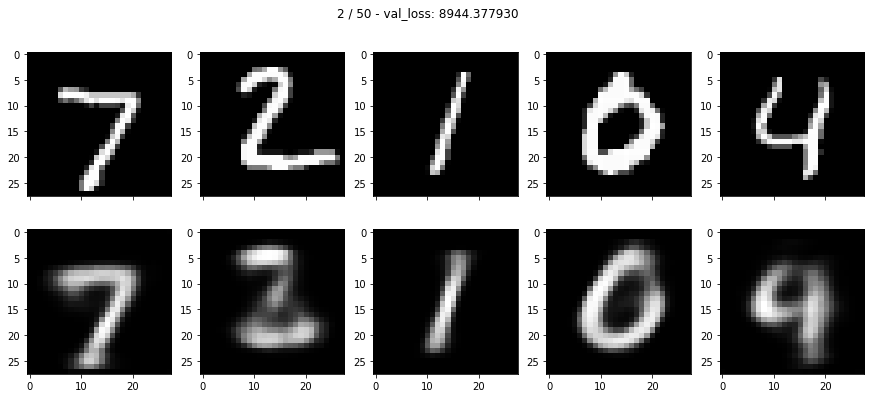

* Epoch 3/50
train loss: 9158.953125


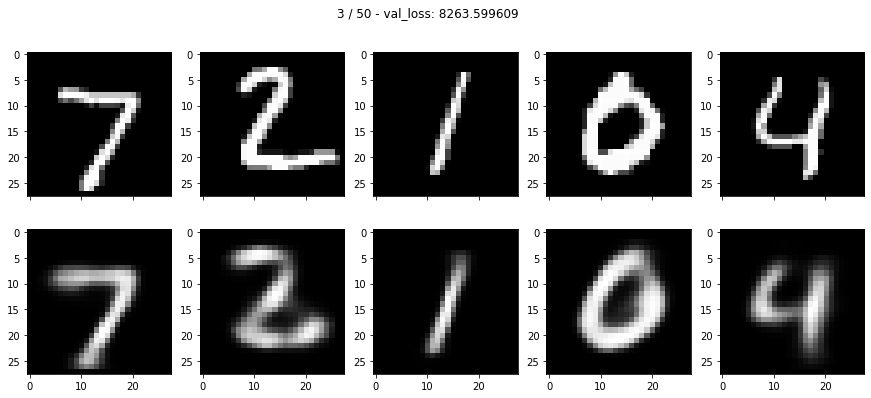

* Epoch 4/50
train loss: 8624.950195


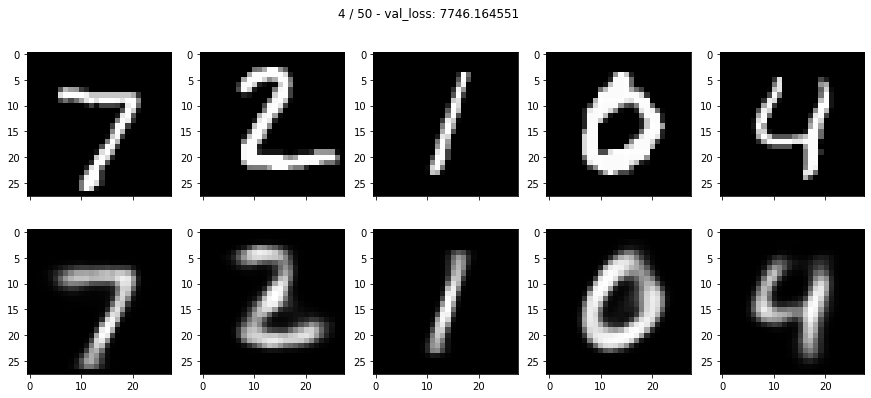

* Epoch 5/50
train loss: 8265.109375


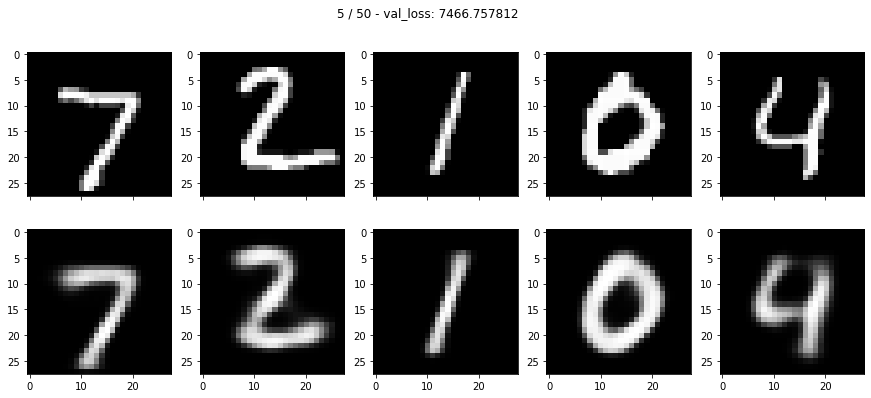

* Epoch 6/50
train loss: 8004.295898


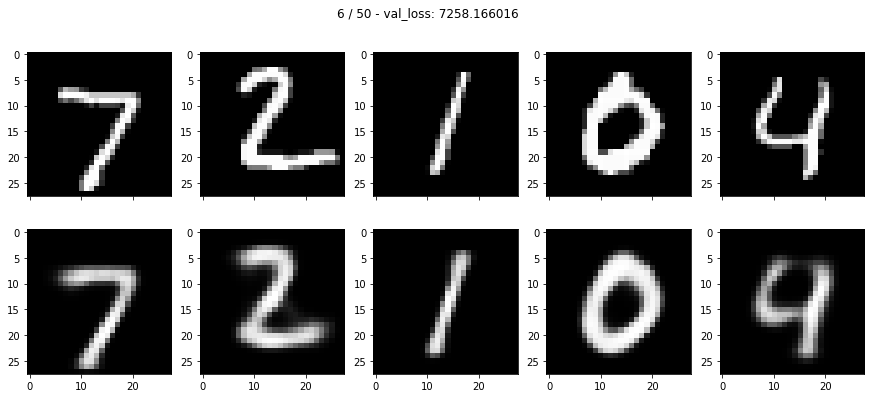

* Epoch 7/50
train loss: 7795.437012


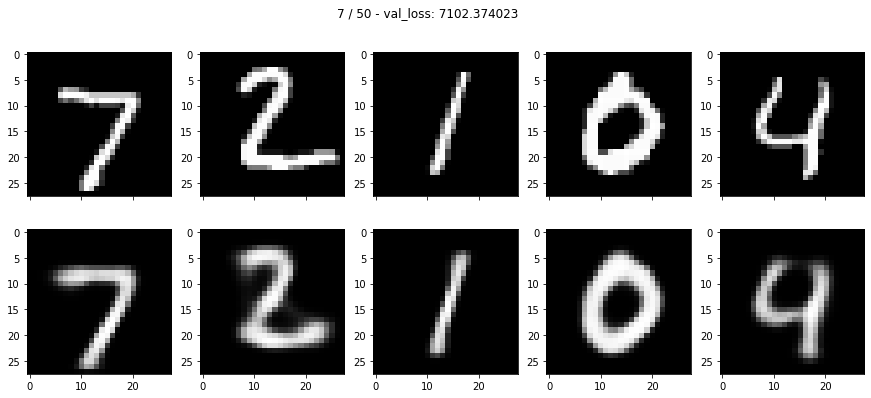

* Epoch 8/50
train loss: 7640.638184


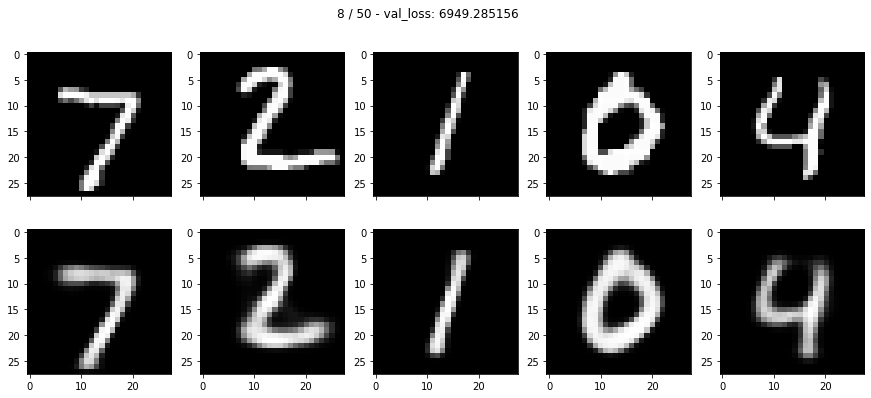

* Epoch 9/50
train loss: 7523.796875


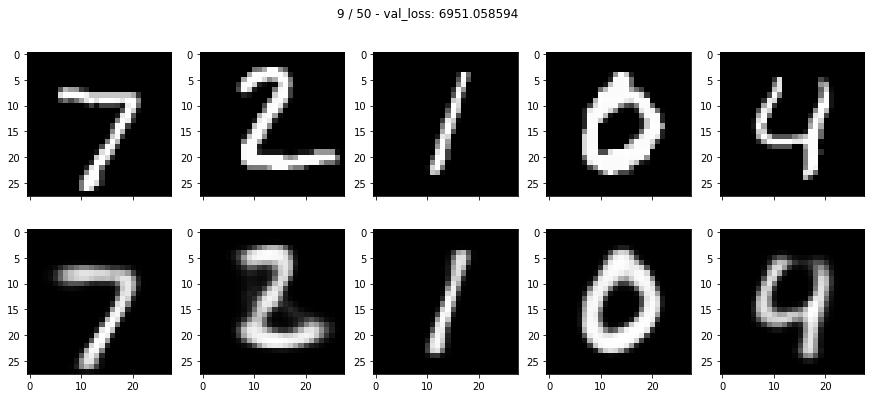

* Epoch 10/50
train loss: 7417.974121


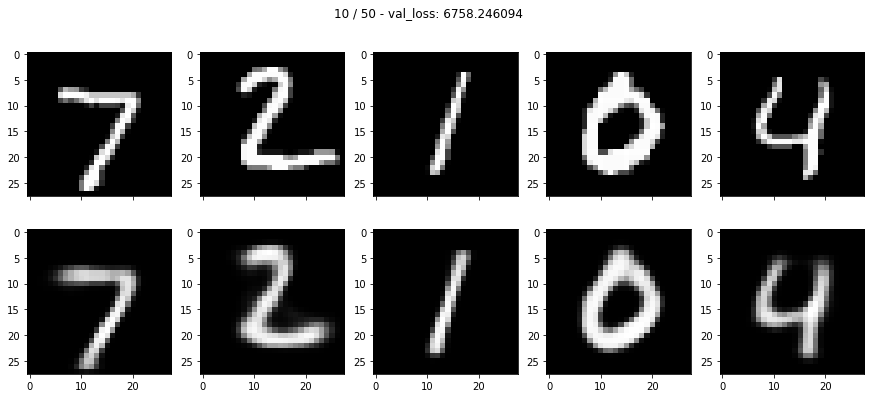

* Epoch 11/50
train loss: 7338.106934


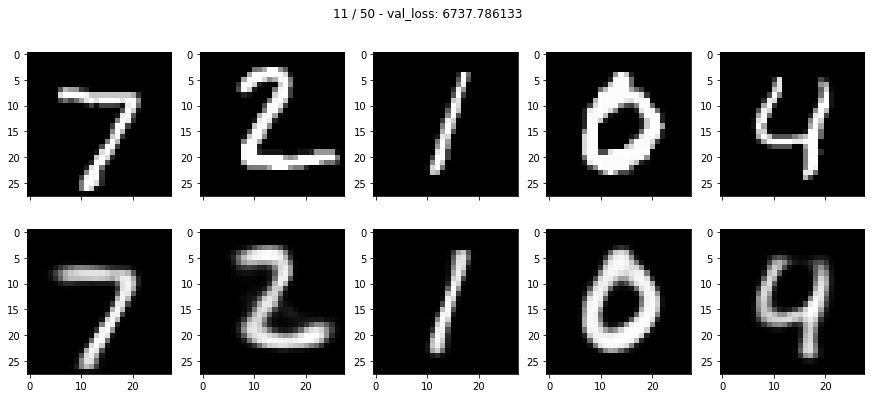

* Epoch 12/50
train loss: 7275.844238


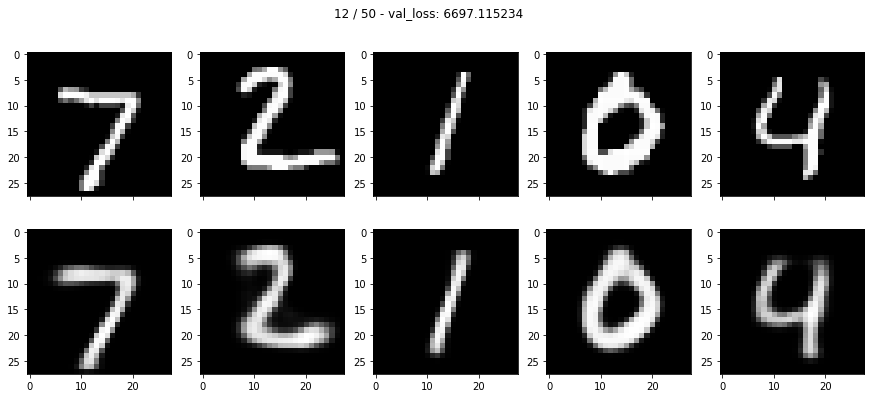

* Epoch 13/50
train loss: 7208.474609


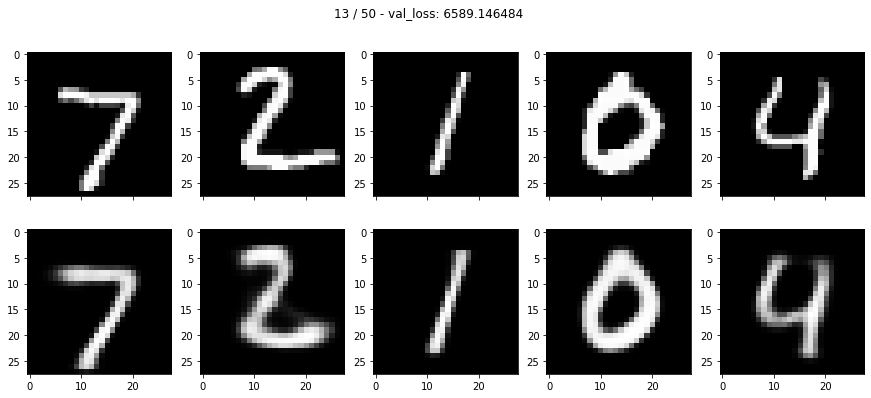

* Epoch 14/50
train loss: 7162.175781


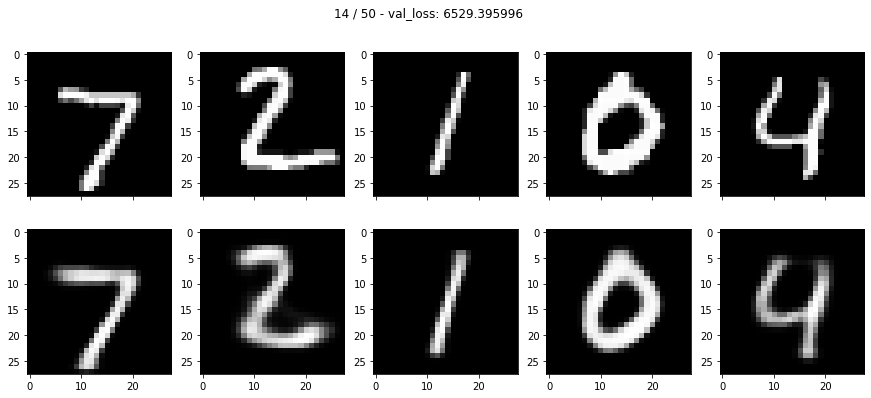

* Epoch 15/50
train loss: 7112.677246


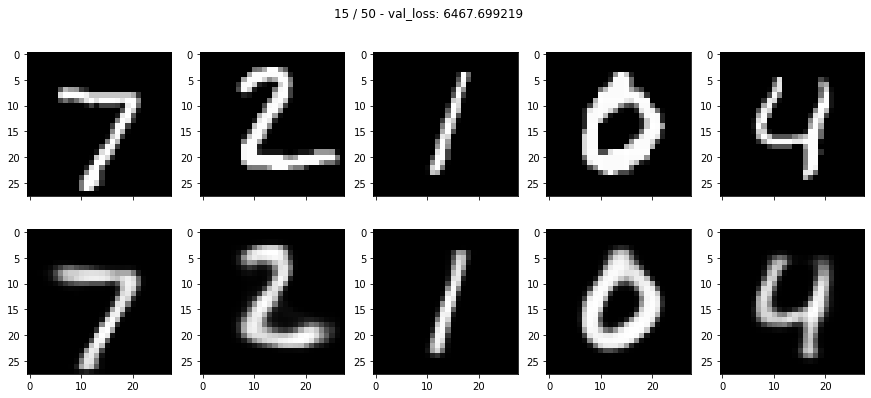

* Epoch 16/50
train loss: 7074.938477


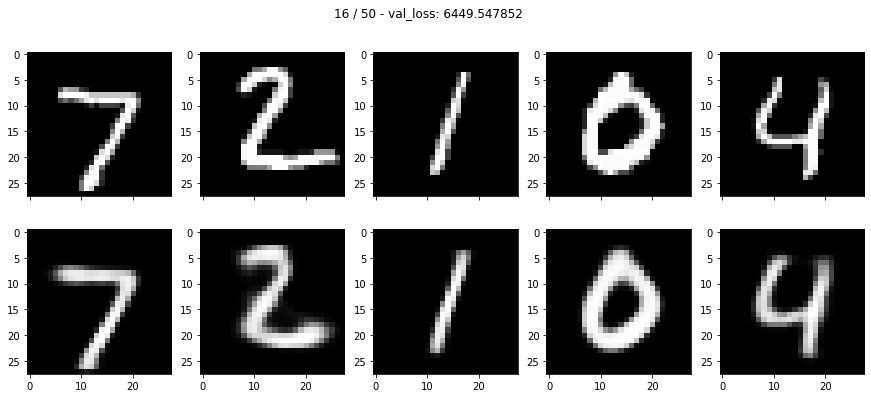

* Epoch 17/50
train loss: 7034.615234


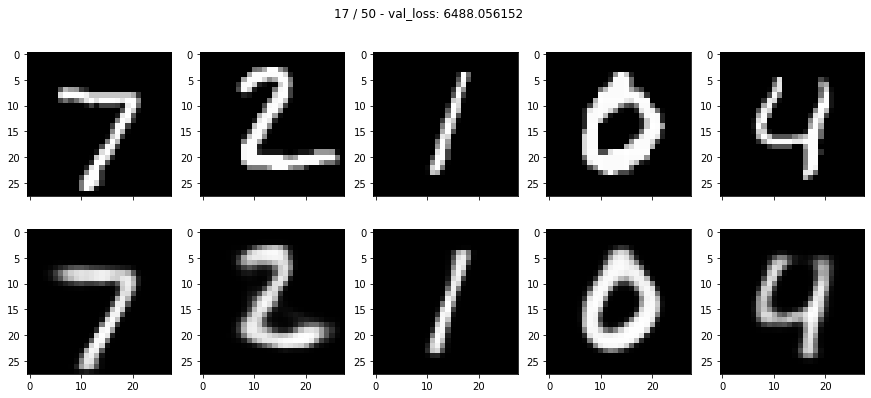

* Epoch 18/50
train loss: 6997.436035


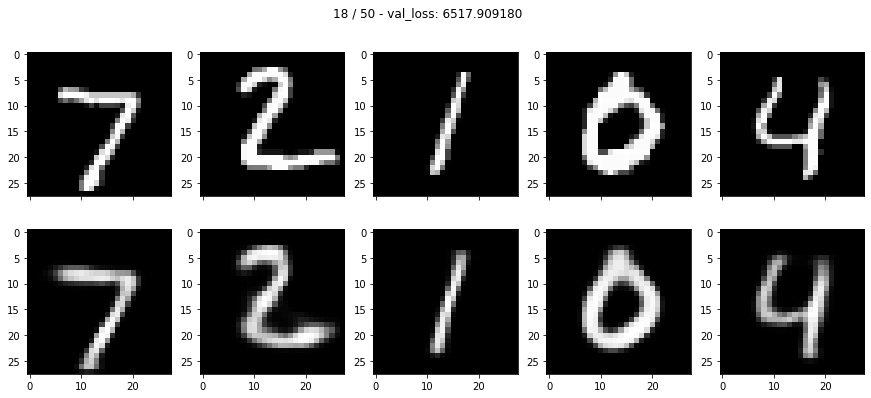

* Epoch 19/50
train loss: 6986.885742


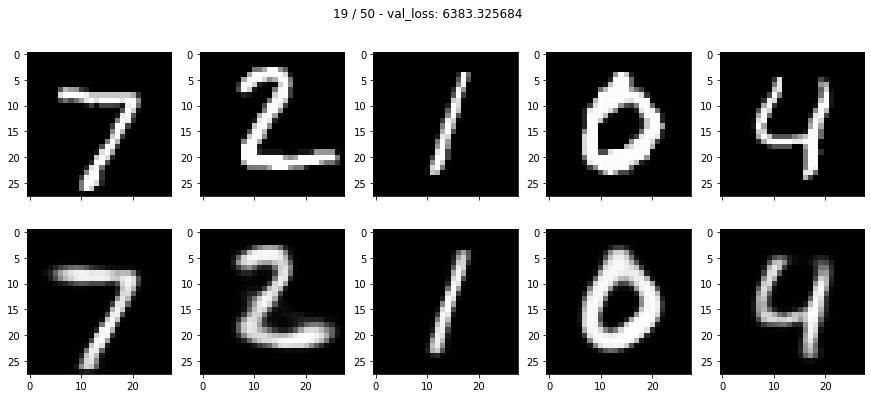

* Epoch 20/50
train loss: 6959.587891


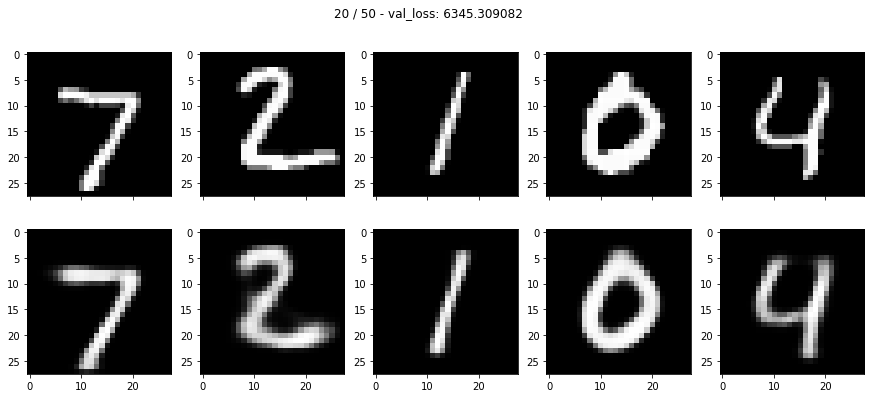

* Epoch 21/50
train loss: 6929.094727


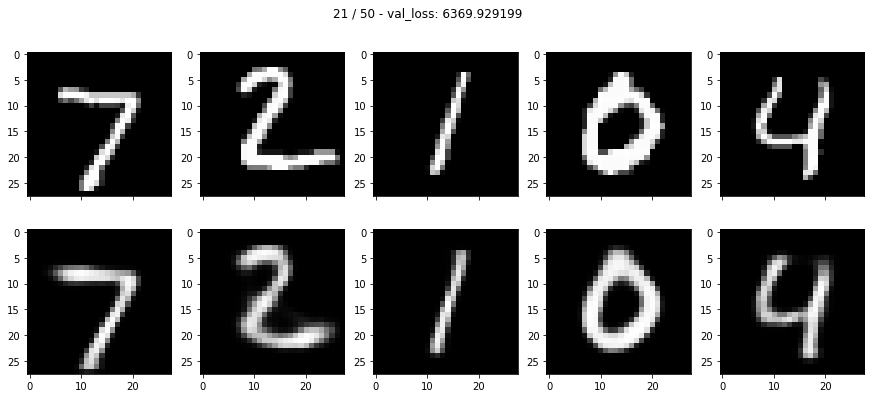

* Epoch 22/50
train loss: 6927.239258


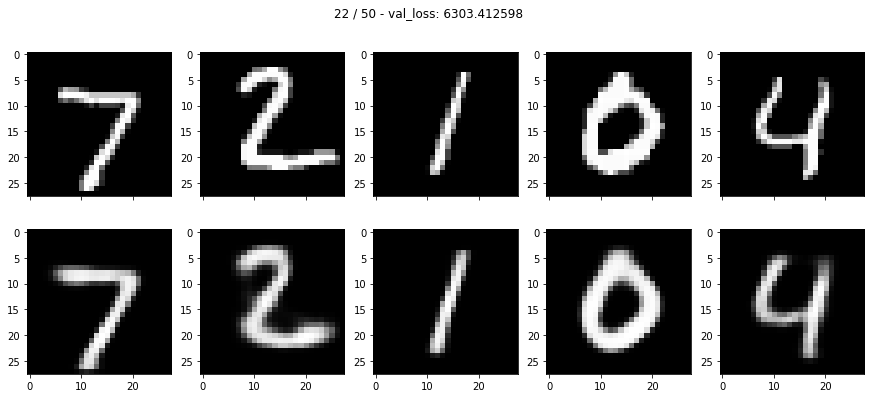

* Epoch 23/50
train loss: 6921.008301


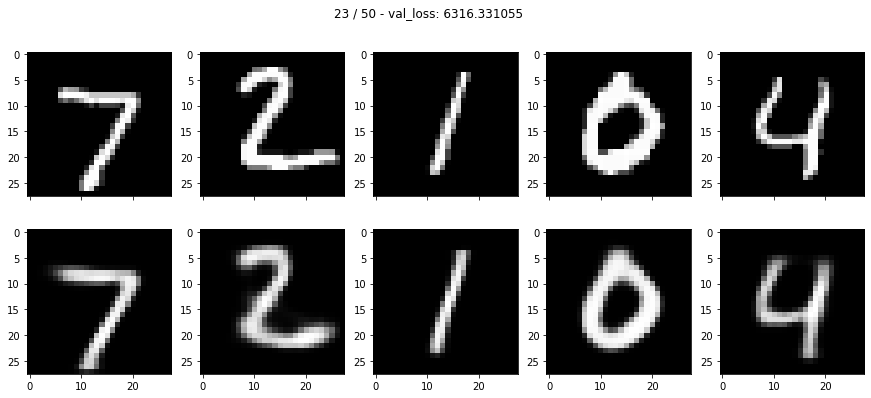

* Epoch 24/50
train loss: 6877.094238


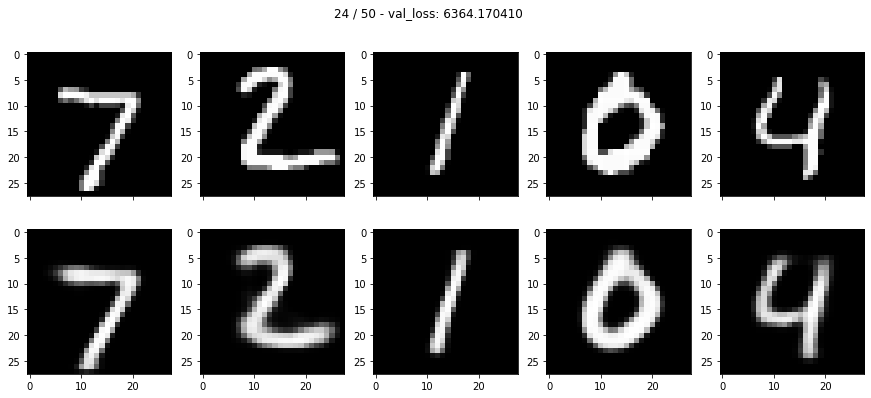

* Epoch 25/50
train loss: 6868.089355


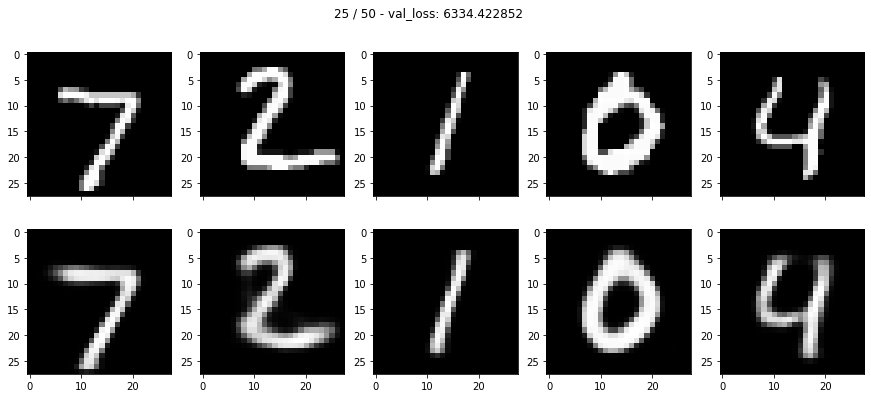

* Epoch 26/50
train loss: 6855.519043


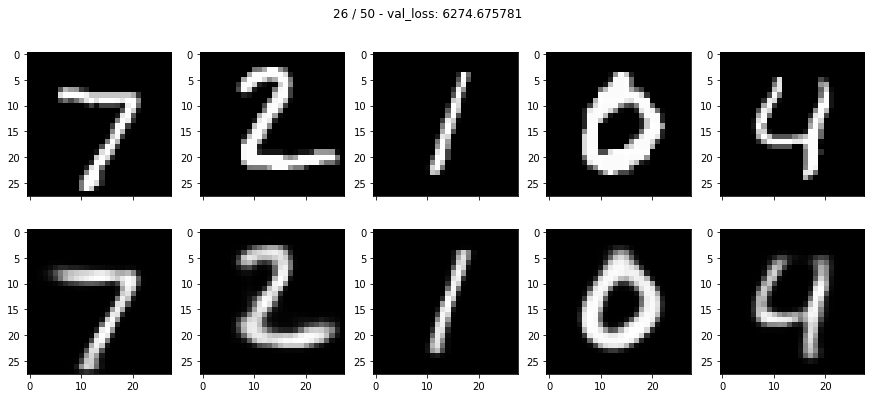

* Epoch 27/50
train loss: 6834.637695


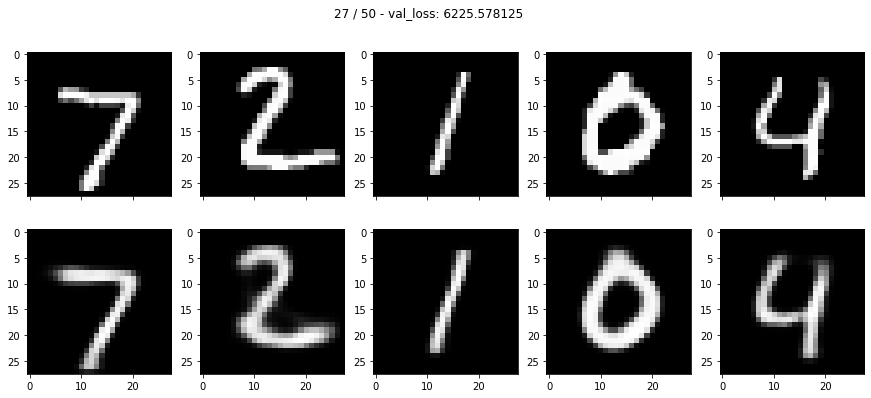

* Epoch 28/50
train loss: 6827.477539


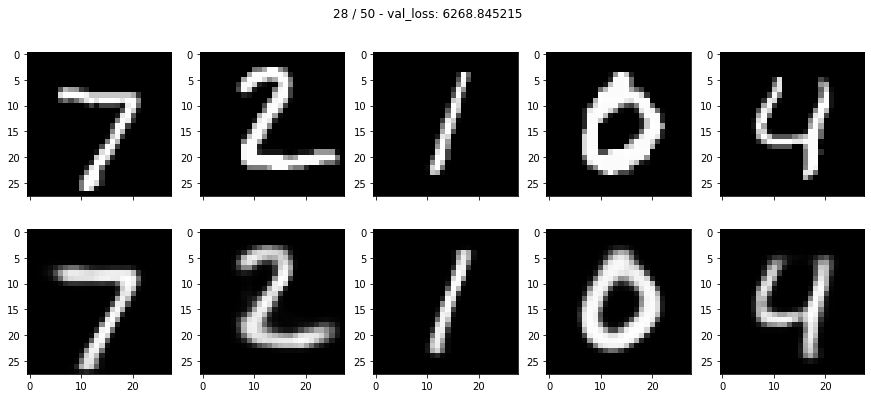

* Epoch 29/50
train loss: 6814.119141


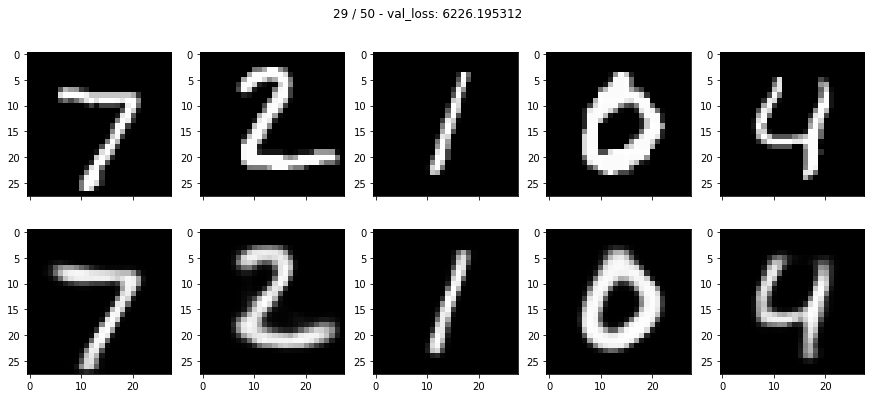

* Epoch 30/50
train loss: 6800.896973


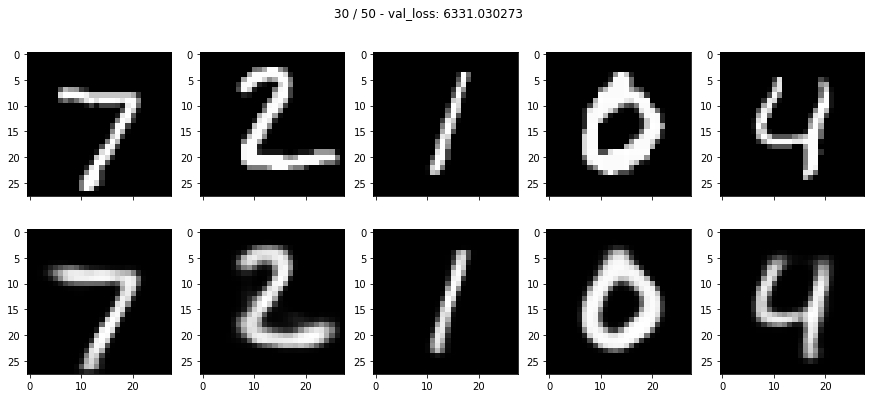

* Epoch 31/50
train loss: 6794.755859


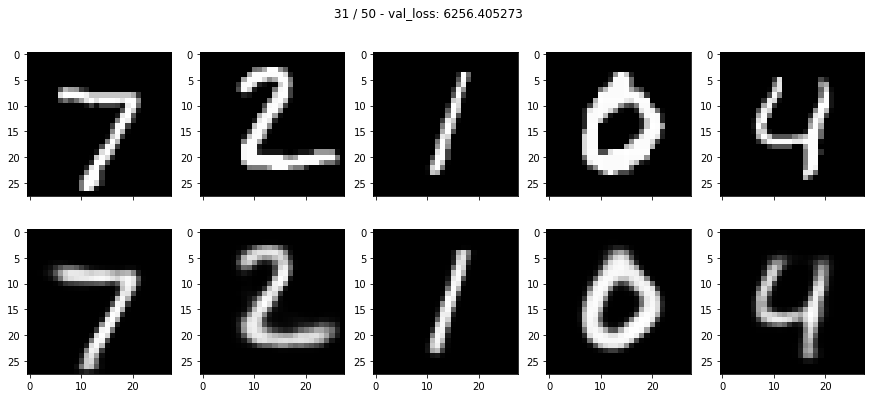

* Epoch 32/50
train loss: 6788.947266


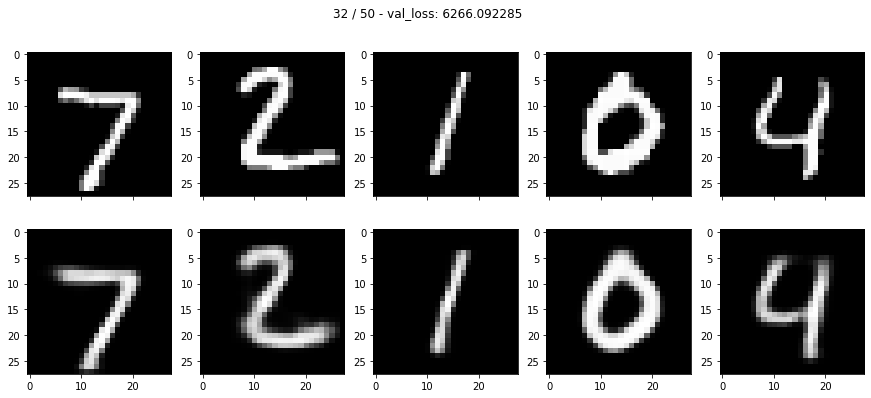

* Epoch 33/50
train loss: 6772.592285


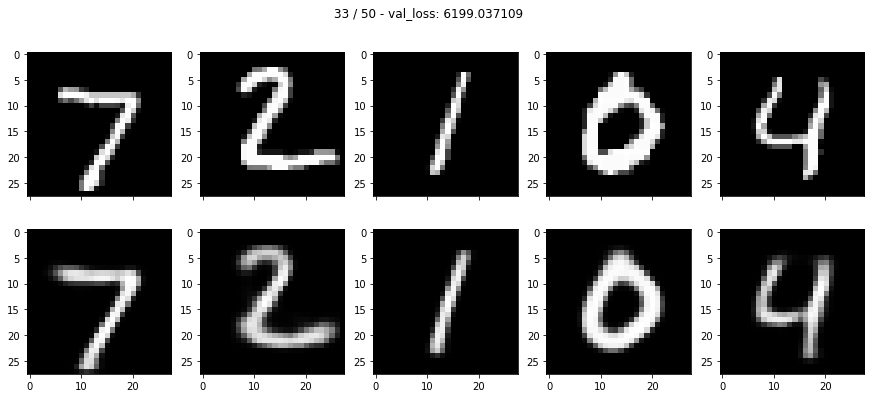

* Epoch 34/50
train loss: 6765.993652


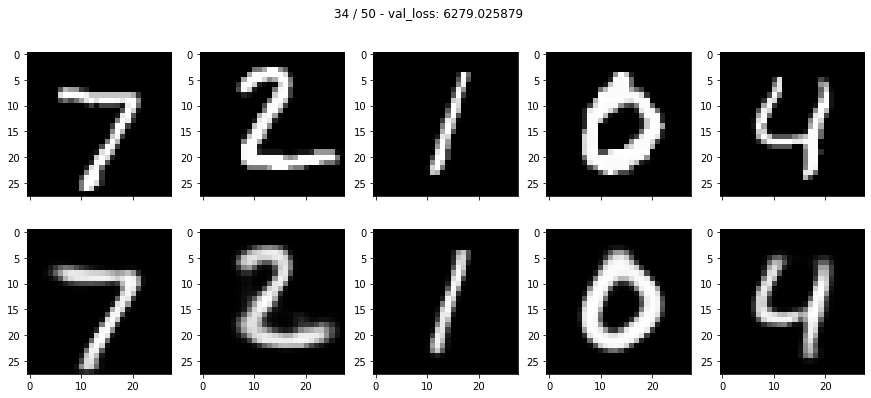

* Epoch 35/50
train loss: 6759.499512


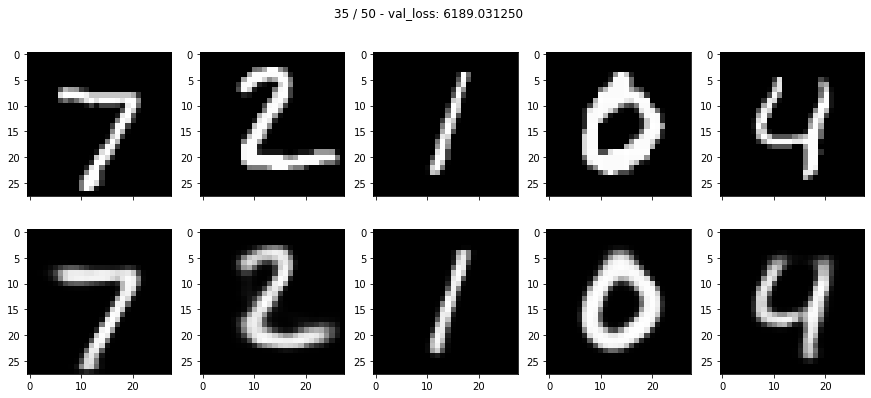

* Epoch 36/50
train loss: 6754.257324


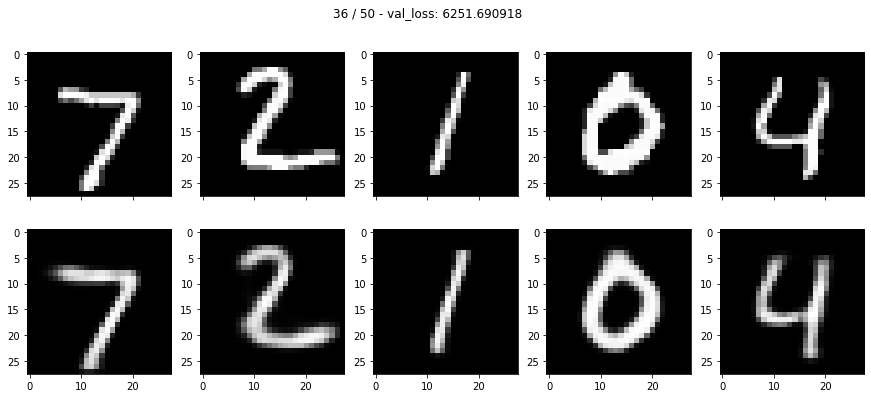

* Epoch 37/50
train loss: 6740.215820


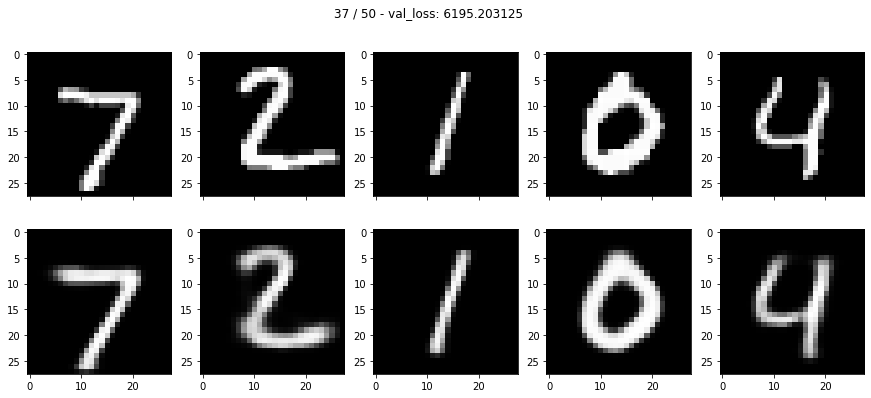

* Epoch 38/50
train loss: 6724.736816


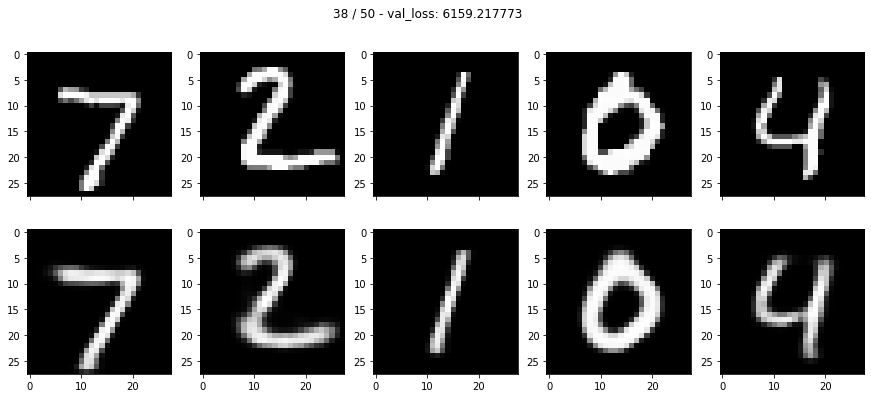

* Epoch 39/50
train loss: 6725.323730


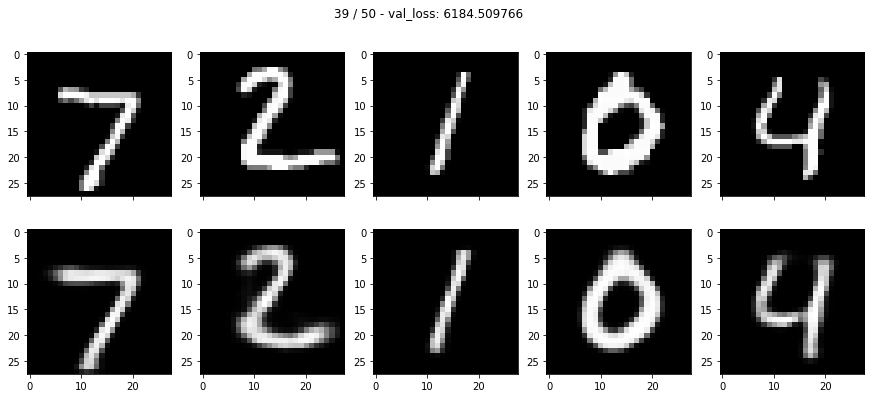

* Epoch 40/50
train loss: 6705.647949


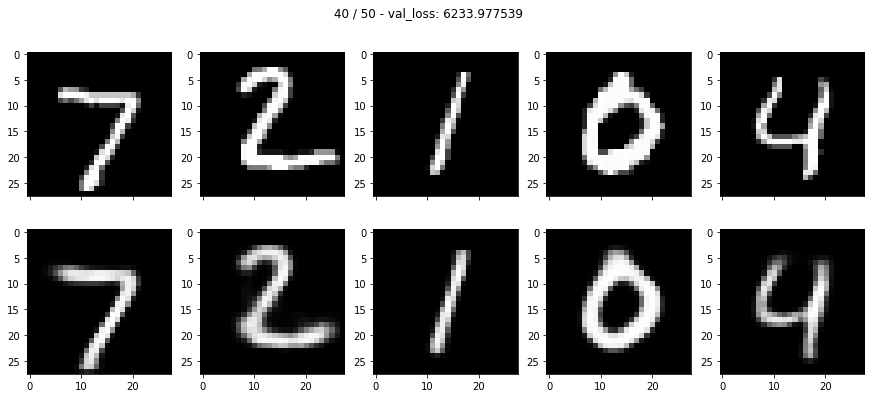

* Epoch 41/50
train loss: 6715.927734


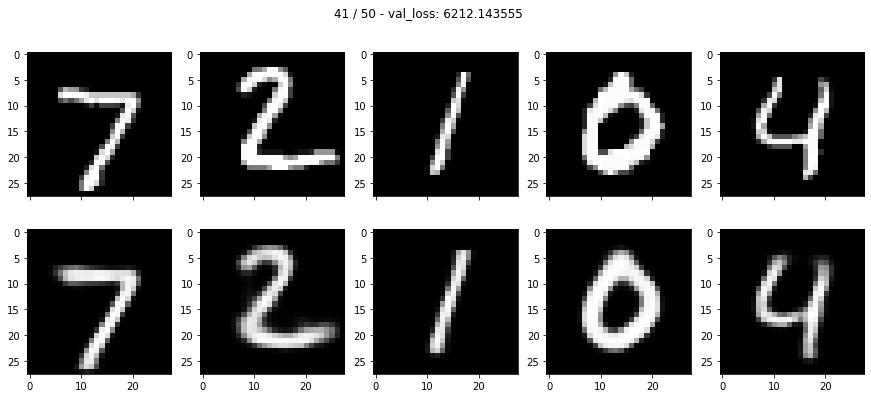

* Epoch 42/50
train loss: 6699.632324


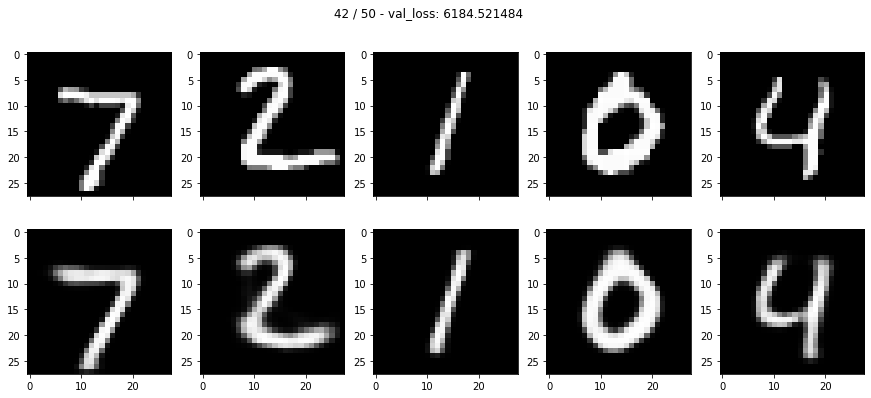

* Epoch 43/50
train loss: 6697.153320


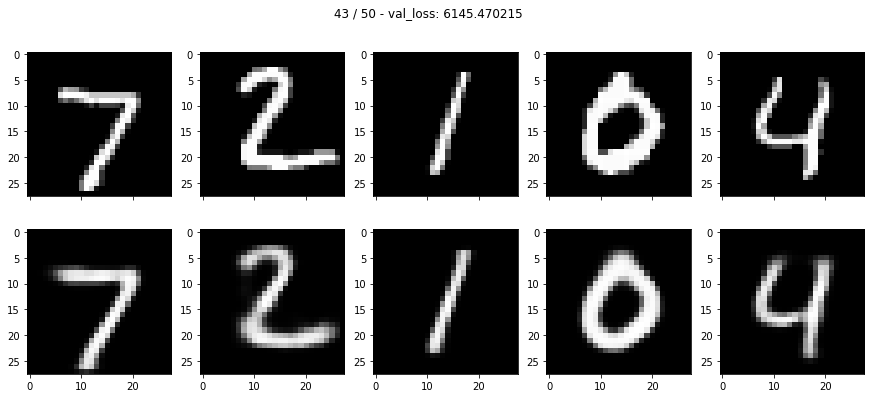

* Epoch 44/50
train loss: 6700.251953


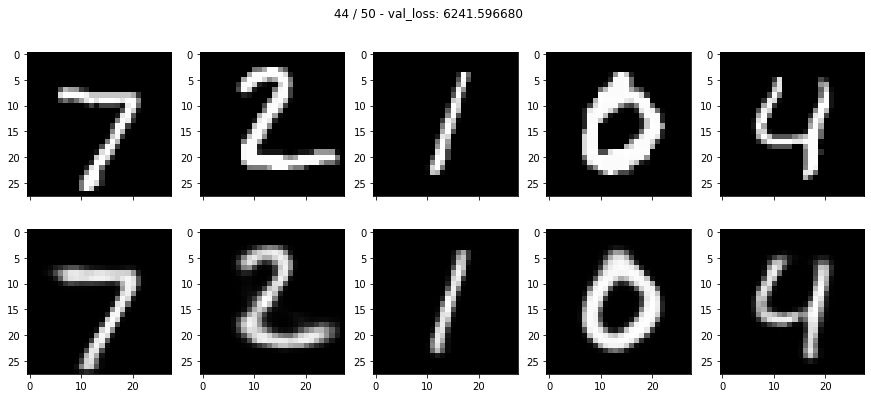

* Epoch 45/50
train loss: 6700.978027


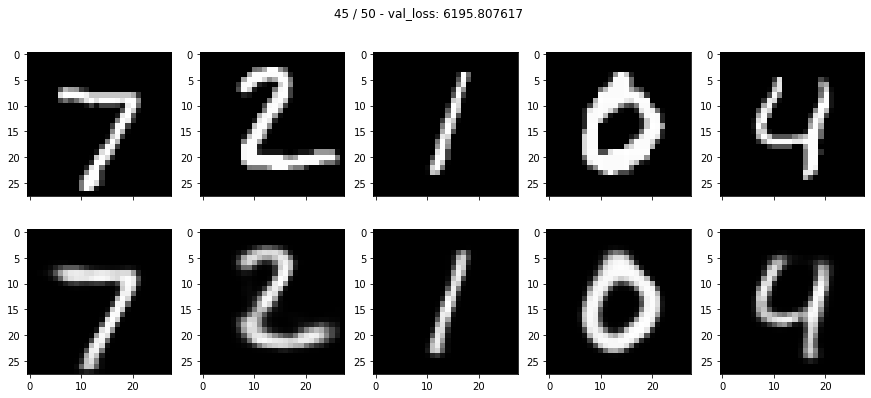

* Epoch 46/50
train loss: 6677.023926


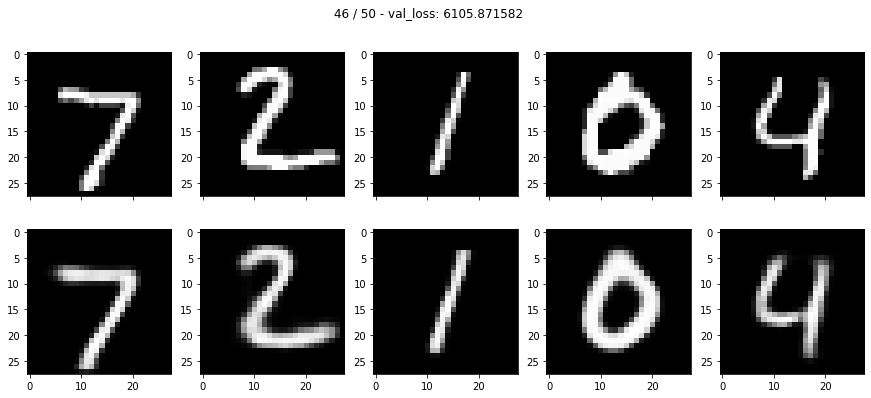

* Epoch 47/50
train loss: 6666.833984


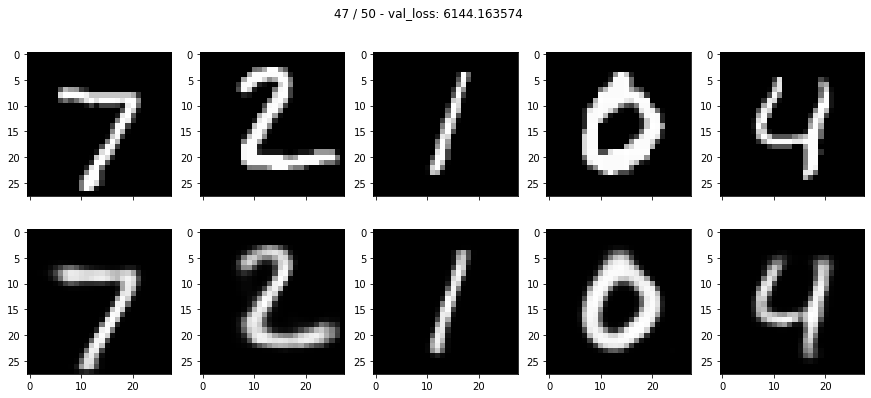

* Epoch 48/50
train loss: 6676.801270


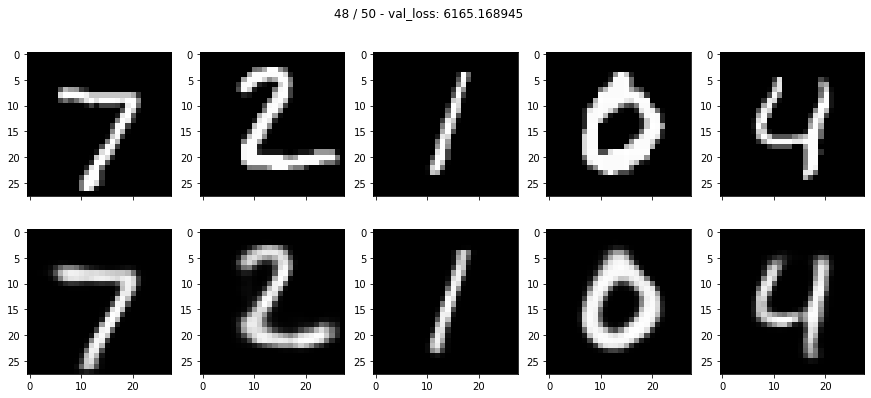

* Epoch 49/50
train loss: 6653.145996


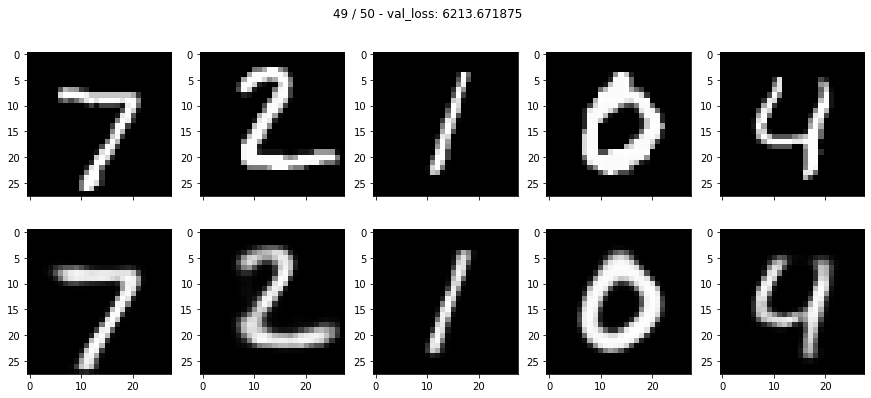

* Epoch 50/50
train loss: 6666.793945


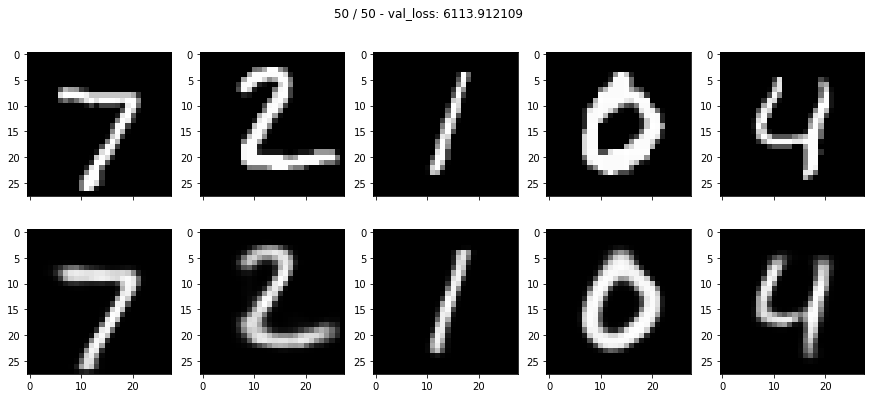

No handles with labels found to put in legend.


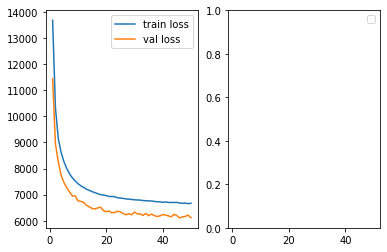

In [ ]:
vae_train(autoencoder, optimizer, scheduler, 50, criterion, train_loader, test_loader)

Давайте посмотрим, как наш тренированный VAE кодирует и восстанавливает картинки:

torch.Size([5, 1, 28, 28])


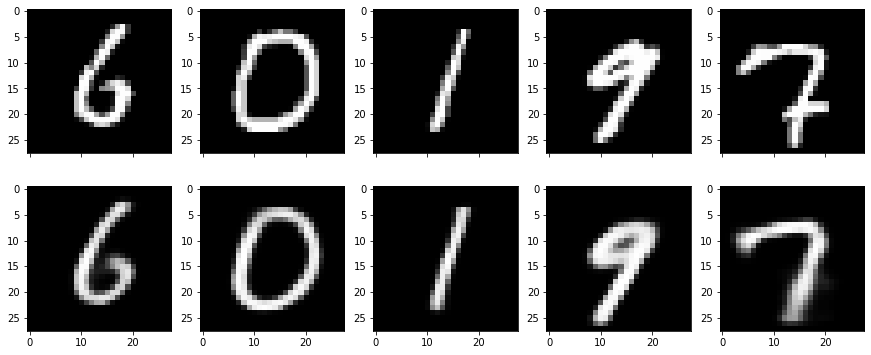

In [ ]:
x_val = next(iter(test_loader))[0]
x_val = x_val[random.sample(range(0,len(x_val)), 5)]
print(x_val.shape)

autoencoder.eval()
with torch.set_grad_enabled(False):
    val_mu, val_logsigma, val_reconstruction = autoencoder(x_val[:5].to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    ax[0][j].imshow(x_val[j].squeeze(), cmap ='gray')

for j in range(5):
    ax[1][j].imshow(val_reconstruction[j].cpu().squeeze(), cmap = 'gray')
plt.show() 

Давайте попробуем проделать для VAE то же, что и с обычным автоэнкодером -- подсунуть decoder'у из VAE случайные векторы из нормального распределения и посмотреть, какие картинки получаются:

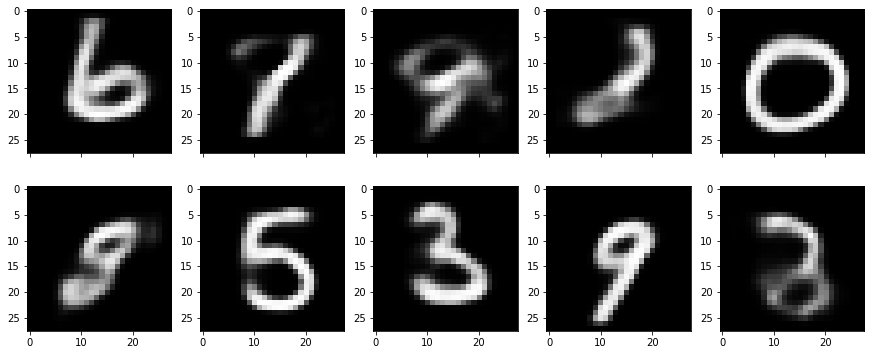

In [ ]:
# вспомните про замечание из этого же пункта обычного AE про распределение латентных переменных
z = np.array([np.random.normal(0, 1, features) for i in range(10)])
autoencoder.eval()
with torch.set_grad_enabled(False):
    output = autoencoder.decode(torch.Tensor(z).to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    ax[0][j].imshow(output[j].squeeze().cpu(), cmap ='gray')

for j in range(5):
    ax[1][j].imshow(output[j+5].cpu().squeeze(), cmap = 'gray')
plt.show()     

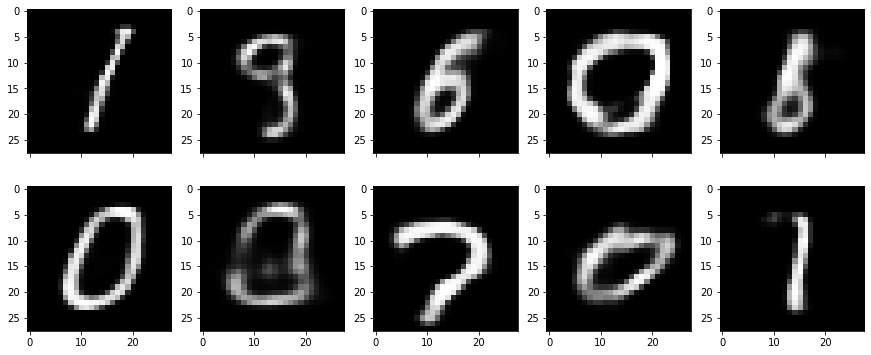

In [ ]:
# вспомните про замечание из этого же пункта обычного AE про распределение латентных переменных
mu = val_mu.mean(axis=0)
std = val_mu.std(axis=0)
z = np.array([np.random.normal(mu.cpu(), std.cpu(), features) for i in range(10)])
autoencoder.eval()
with torch.set_grad_enabled(False):
    output = autoencoder.decode(torch.Tensor(z).to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    ax[0][j].imshow(output[j].squeeze().cpu(), cmap ='gray')

for j in range(5):
    ax[1][j].imshow(output[j+5].cpu().squeeze(), cmap = 'gray')
plt.show()     

In [ ]:
from sklearn.manifold import TSNE


tl = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=10000, shuffle=True)

## 2.2. Latent Representation (2 балла)

Давайте посмотрим, как латентные векторы картинок лиц выглядят в пространстве.
Ваша задача -- изобразить латентные векторы картинок точками в двумерном просторанстве. 

Это позволит оценить, насколько плотно распределены латентные векторы изображений цифр в пространстве. 

Плюс давайте сделаем такую вещь: покрасим точки, которые соответствуют картинкам каждой цифры, в свой отдельный цвет

Подсказка: красить -- это просто =) У plt.scatter есть параметр c (color), см. в документации.


Итак, план:
1. Получить латентные представления картинок тестового датасета
2. С помощтю `TSNE` (есть в `sklearn`) сжать эти представления до размерности 2 (чтобы можно было их визуализировать точками в пространстве)
3. Визуализировать полученные двумерные представления с помощью `matplotlib.scatter`, покрасить разными цветами точки, соответствующие картинкам разных цифр.

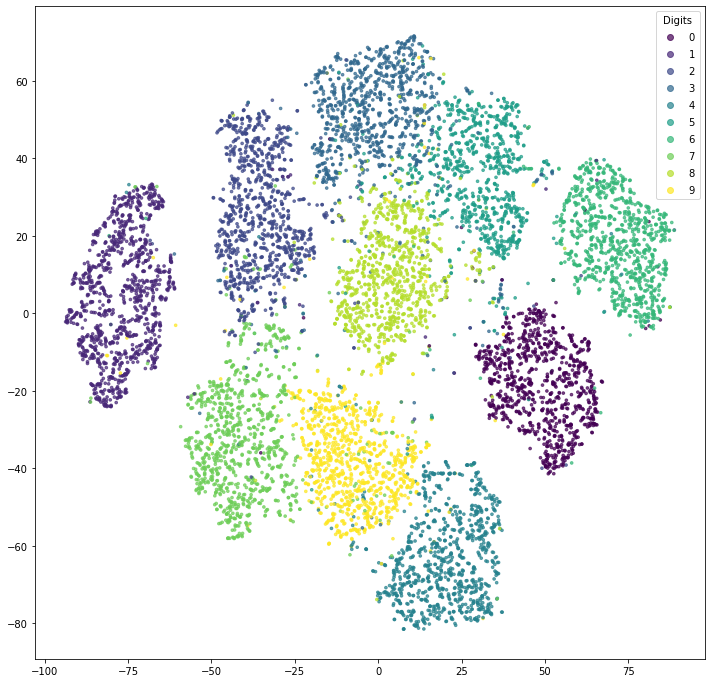

In [ ]:
x_val, y_val = next(iter(tl))
numbers = random.sample(range(0,len(x_val)), len(x_val))
x_val = x_val[numbers]
y_val = y_val[numbers]

autoencoder.eval()
with torch.set_grad_enabled(False): 
    val_mu, val_logsigma, val_reconstruction = autoencoder(x_val.to(device))

vector_2d = TSNE().fit_transform(val_mu.cpu())
vector_2d.shape
plt.figure(figsize=(12,12))
scatter = plt.scatter(vector_2d[:,0], vector_2d[:,1], c = y_val, label = y_val, alpha = 0.7, s = 7)
legend = plt.legend(*scatter.legend_elements(),loc = 'upper right', title ='Digits')

plt.show()

Что вы думаете о виде латентного представления?

__Congrats v2.0!__

## 2.3. Conditional VAE (6 баллов)


Мы уже научились обучать обычный AE на датасете картинок и получать новые картинки, используя генерацию шума и декодер. 
Давайте теперь допустим, что мы обучили AE на датасете MNIST и теперь хотим генерировать новые картинки с числами с помощью декодера (как выше мы генерили рандомные лица). 
И вот нам понадобилось сгенерировать цифру 8, и мы подставляем разные варианты шума, но восьмерка никак не генерится:(

Хотелось бы добавить к нашему AE функцию "выдай мне рандомное число из вот этого вот класса", где классов десять (цифры от 0 до 9 образуют десять классов).  Conditional AE — так называется вид автоэнкодера, который предоставляет такую возможность. Ну, название "conditional" уже говорит само за себя.

И в этой части задания мы научимся такие обучать.

### Архитектура

На картинке ниже представлена архитектура простого Conditional VAE.

По сути, единственное отличие от обычного -- это то, что мы вместе с картинкой в первом слое энкодера и декодера передаем еще информацию о классе картинки. 

То есть, в первый (входной) слой энкодера подается конкатенация картинки и информации о классе (например, вектора из девяти нулей и одной единицы). В первый слой декодера подается конкатенация латентного вектора и информации о классе.


![alt text](https://sun9-63.userapi.com/impg/Mh1akf7mfpNoprrSWsPOouazSmTPMazYYF49Tw/djoHNw_9KVA.jpg?size=1175x642&quality=96&sign=e88baec5f9bb91c8443fba31dcf0a4df&type=album)

![alt text](https://sun9-73.userapi.com/impg/UDuloLNKhzTBYAKewgxke5-YPsAKyGOqA-qCRg/MnyCavJidxM.jpg?size=1229x651&quality=96&sign=f2d21bfacc1c5755b76868dc4cfef39c&type=album)



На всякий случай: это VAE, то есть, latent у него все еще состоит из mu и sigma

Таким образом, при генерации новой рандомной картинки мы должны будем передать декодеру сконкатенированные латентный вектор и класс картинки.

P.S. Также можно передавать класс картинки не только в первый слой, но и в каждый слой сети. То есть на каждом слое конкатенировать выход из предыдущего слоя и информацию о классе.

In [ ]:
def conv(in_channels, out_channels, kernel = 3, stride = 1, padding = 1):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel, stride, padding = padding),
        nn.ReLU()
    )
def deconv(in_channels, out_channels, kernel = 3, stride = 1, padding = 1):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels, out_channels, kernel, stride, padding = padding),
        nn.Sigmoid(),
    )

features = 16

class CVAE(nn.Module):
    def __init__(self):
        super(CVAE, self).__init__()
        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1, (3,24,24))

        self.feature_enc = conv(1,3,5,1,0)

        self.linear_enc = nn.Sequential(
            nn.Linear(3*24*24+10,256),
            nn.ReLU(),
            nn.Linear(256,64),
            nn.ReLU(),
            nn.Linear(64, features*2),
        )
        self.linear_dec = nn.Sequential(
            nn.Linear(features+10, 64),
            nn.ReLU(),
            nn.Linear(64,256),
            nn.ReLU(),
            nn.Linear(256,3*24*24),
        )
        self.feature_dec = deconv(3,1,5,1,0)

    def encode(self, x, class_num):
        x = self.feature_enc(x)
        x = self.flatten(x)
        hot_class = F.one_hot(class_num.long(), num_classes = 10)
        x = torch.cat((hot_class,x), dim = 1)
        x = self.linear_enc(x).view(-1,2,features)
        mu = x[:,0,:]
        logsigma = x[:,1,:]
        return mu, logsigma
    
    def gaussian_sampler(self, mu, logsigma):
        std = torch.exp(0.5*logsigma)
        
        if self.training:
            eps = torch.randn(features).to(device)
            latent_vector = mu + eps*std
            return latent_vector
        else:
            # на инференсе возвращаем не случайный вектор из нормального распределения, а центральный -- mu. 
            # на инференсе выход автоэнкодера должен быть детерминирован.
            return mu
    
    def decode(self, z, class_num):
        hot_class = F.one_hot(class_num.long(),num_classes=10)
        z = torch.cat((hot_class, z), axis=1)
        z = self.linear_dec(z)
        z = self.unflatten(z)
        reconstruction = self.feature_dec(z)
        return reconstruction

    def forward(self, x, class_num):
        mu, logsigma = self.encode(x, class_num)
        latent_vector = self.gaussian_sampler(mu,logsigma)
        reconstruction = self.decode(latent_vector, class_num)
        return mu, logsigma, reconstruction

In [ ]:
def cvae_train(model, opt, scheduler, epochs, loss_fn, data_tr, data_val):
    x_val, y_val = next(iter(data_val))
    train_loss_history, val_loss_history = [], []
    best_val_loss = 1e9
    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs))
        
        avg_loss = 0
        model.train()
        for X_batch, y_batch in data_tr:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            opt.zero_grad()
            mu, logsigma, reconstruction = model(X_batch, y_batch)
            loss = loss_fn(X_batch, mu, logsigma, reconstruction)
            loss.backward()
            opt.step()
            avg_loss += loss / len(data_tr)
        scheduler.step()
        toc = time()
        train_loss_history.append(avg_loss)
        print('train loss: %f' % avg_loss)

        model.eval()
        with torch.set_grad_enabled(False):
            val_mu, val_logsigma, val_reconstruction = model(x_val.to(device), y_val.to(device))
            val_loss = loss_fn(x_val.cpu(), val_mu.cpu(), val_logsigma.cpu(), val_reconstruction.cpu())
            val_loss_history.append(val_loss)
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_weights = model.state_dict()

        fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
        for j in range(5):
            ax[0][j].imshow(x_val[j].squeeze(), cmap ='gray')

        for j in range(5):
            ax[1][j].imshow(val_reconstruction[j].cpu().squeeze(), cmap = 'gray')

        plt.suptitle('%d / %d - val_loss: %f  ' % (epoch+1, epochs, val_loss)) 
        plt.show()  
        for param in model.parameters():
            #print('param is:',param)
            #print('grad of param:', param.grad)
            break
    plt_epochs = range(1, epochs+1)
    fig, ax = plt.subplots(1,2, sharex = True)

    ax[0].plot(plt_epochs, train_loss_history, label = 'train loss')
    ax[0].plot(plt_epochs, val_loss_history, label = 'val loss')
    ax[0].legend()
    ax[1].legend()
    plt.show()
    
    model.load_state_dict(best_model_weights)


In [ ]:
criterion = loss_vae
autoencoder = CVAE().to(device)

In [ ]:
optimizer = torch.optim.Adam(autoencoder.parameters(), lr = 4e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size = 50, gamma = 0.2)

* Epoch 1/50
train loss: 12717.083008


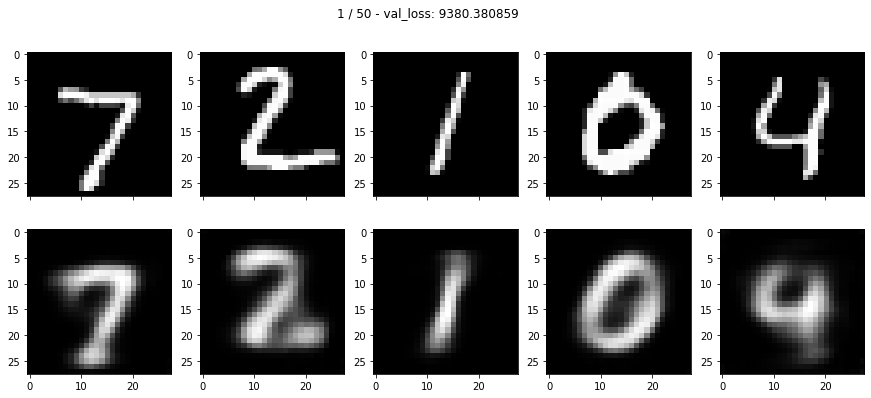

* Epoch 2/50
train loss: 9402.333008


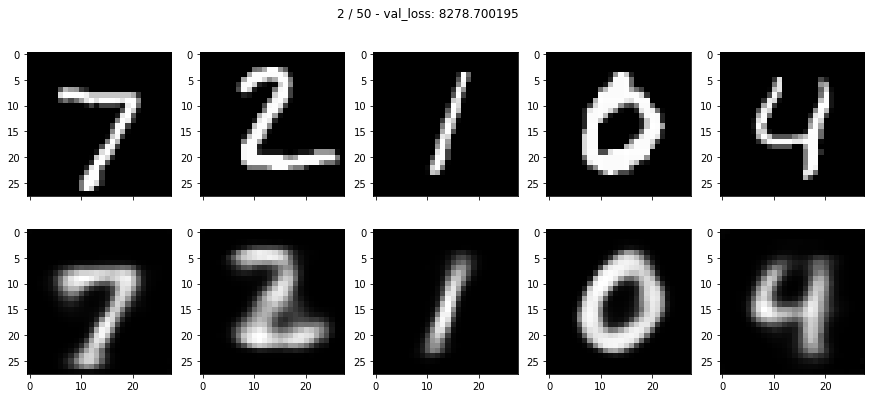

* Epoch 3/50
train loss: 8707.768555


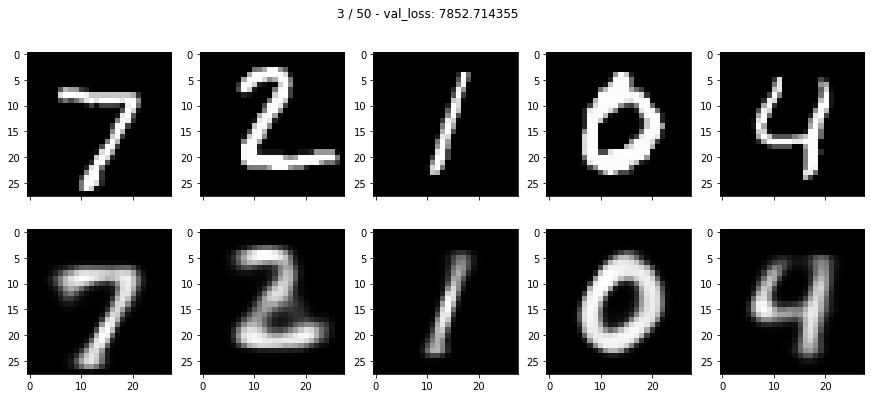

* Epoch 4/50
train loss: 8298.607422


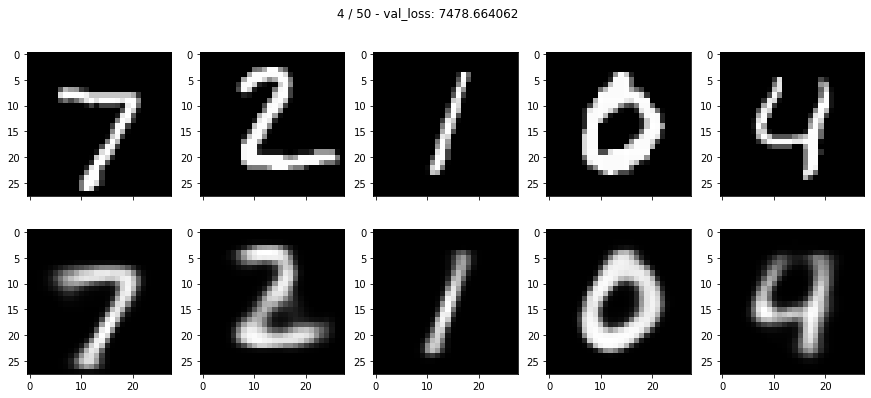

* Epoch 5/50
train loss: 7962.117676


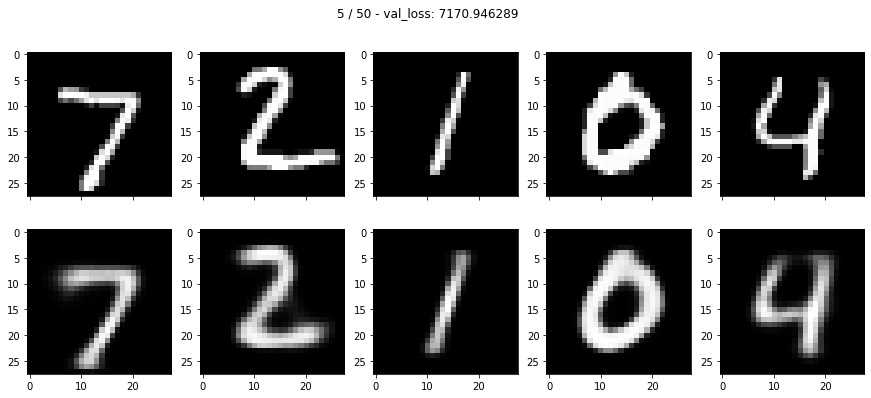

* Epoch 6/50
train loss: 7726.424805


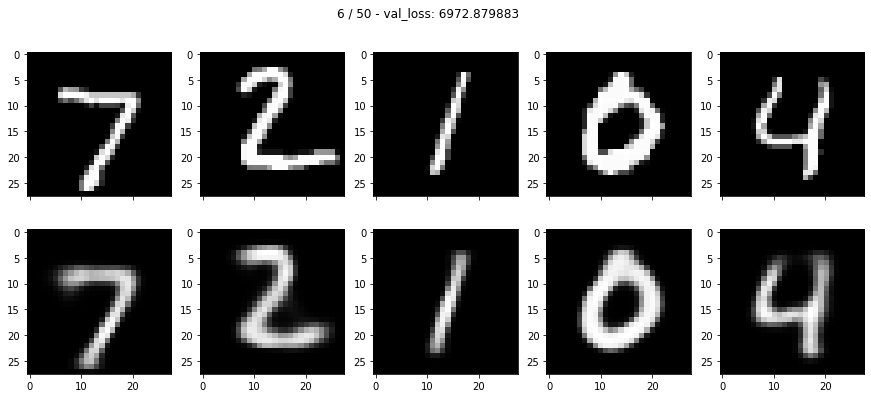

* Epoch 7/50
train loss: 7543.731445


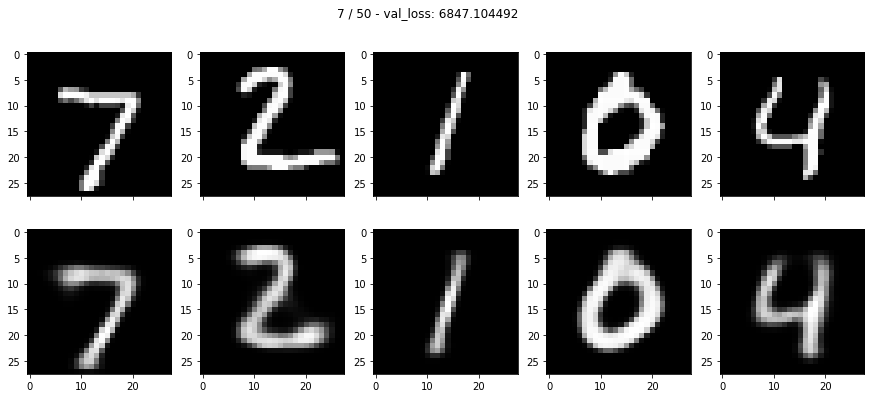

* Epoch 8/50
train loss: 7408.355469


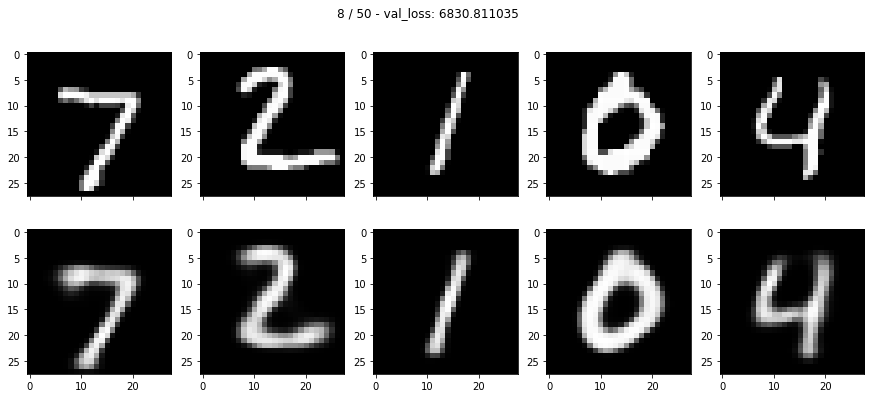

* Epoch 9/50
train loss: 7311.084473


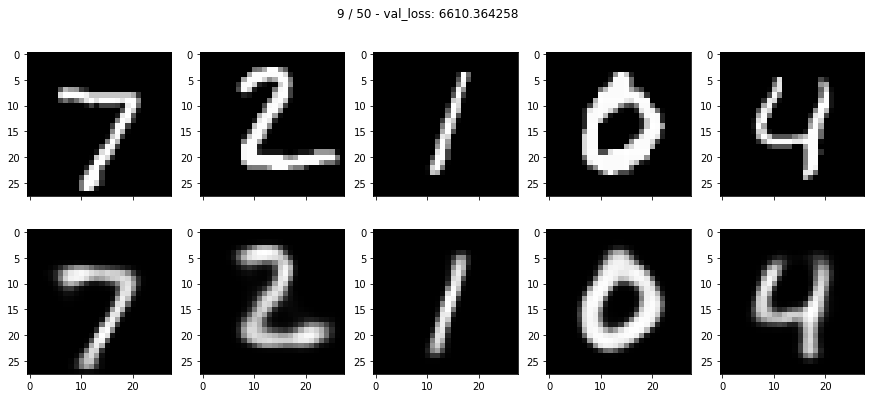

* Epoch 10/50
train loss: 7224.056641


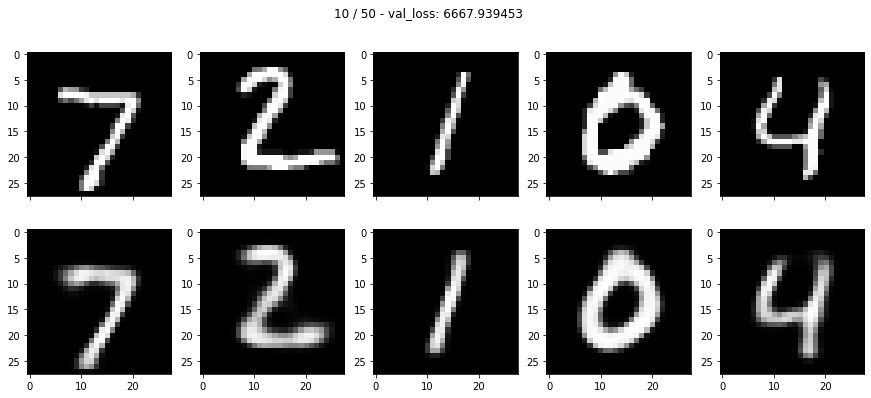

* Epoch 11/50
train loss: 7133.868164


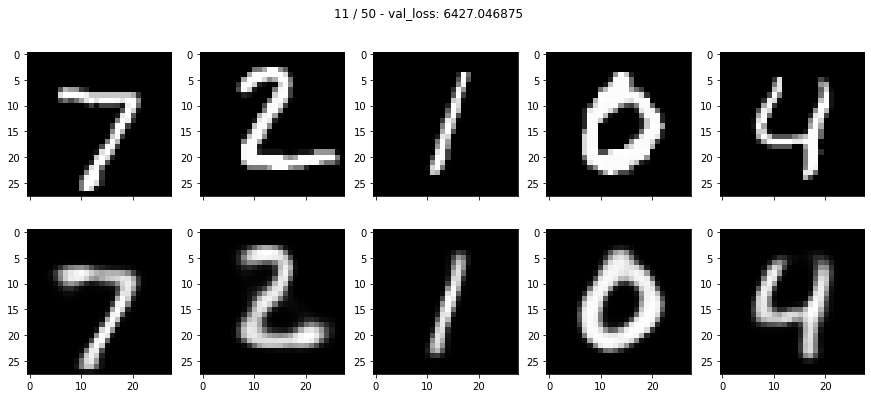

* Epoch 12/50
train loss: 7077.061035


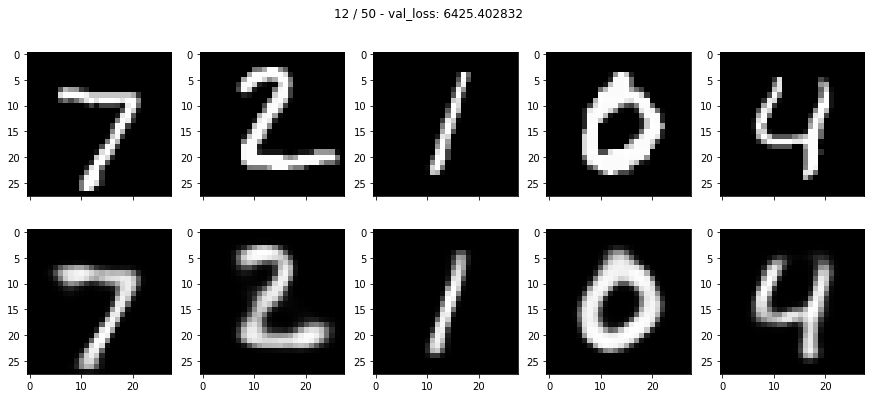

* Epoch 13/50
train loss: 7018.762695


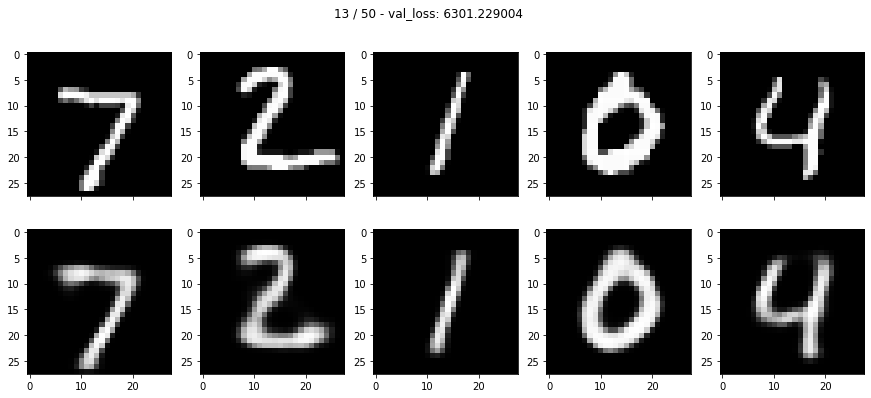

* Epoch 14/50
train loss: 6977.126953


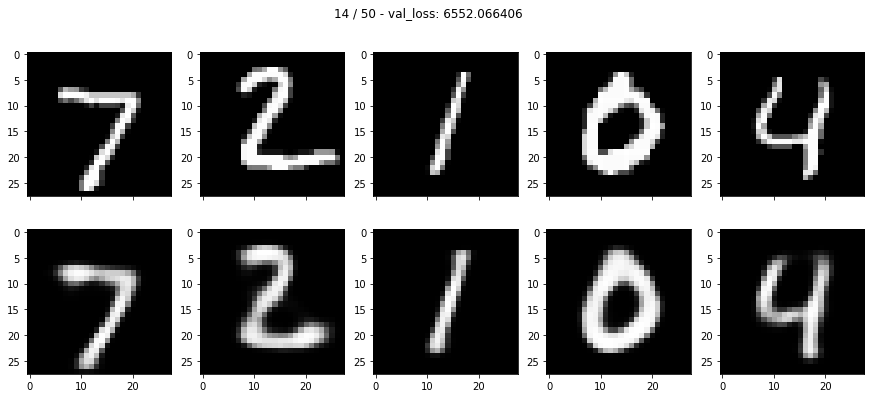

* Epoch 15/50
train loss: 6928.824219


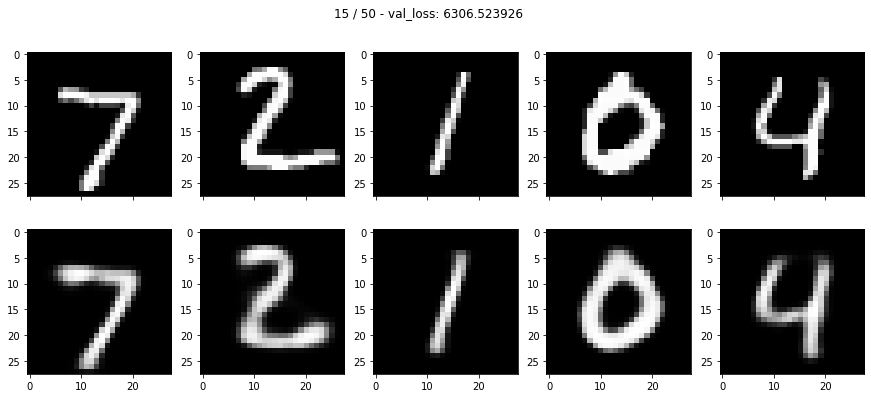

* Epoch 16/50
train loss: 6883.196289


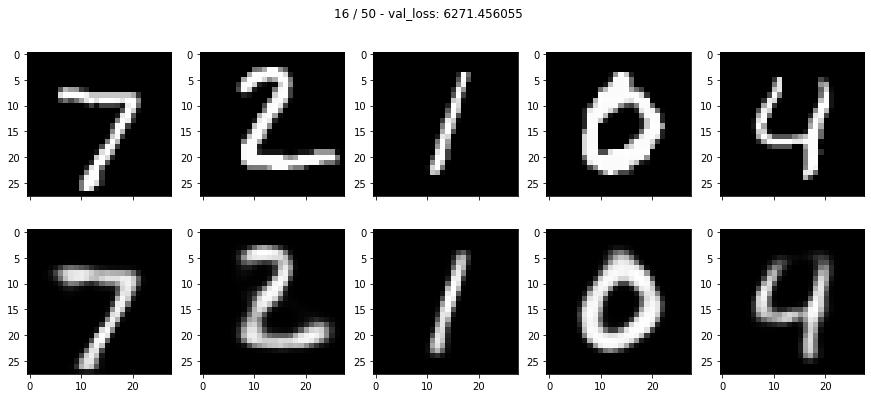

* Epoch 17/50
train loss: 6855.195801


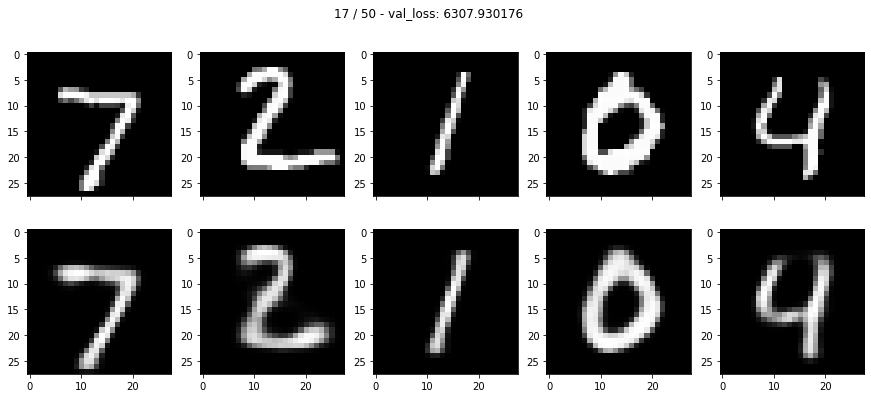

* Epoch 18/50
train loss: 6825.627441


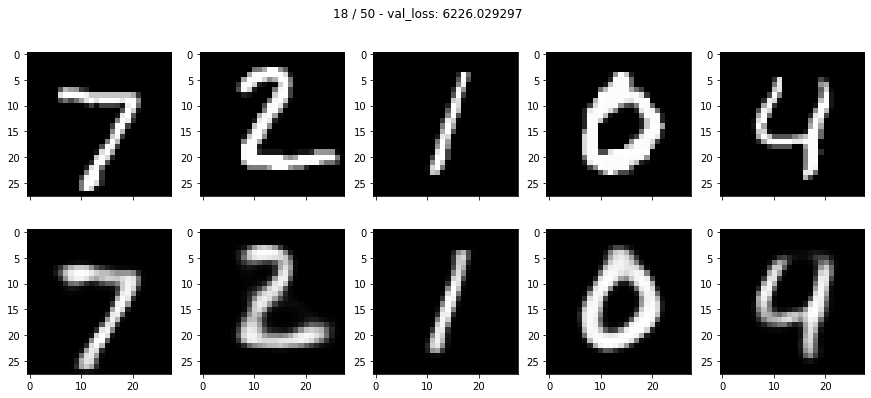

* Epoch 19/50
train loss: 6778.910156


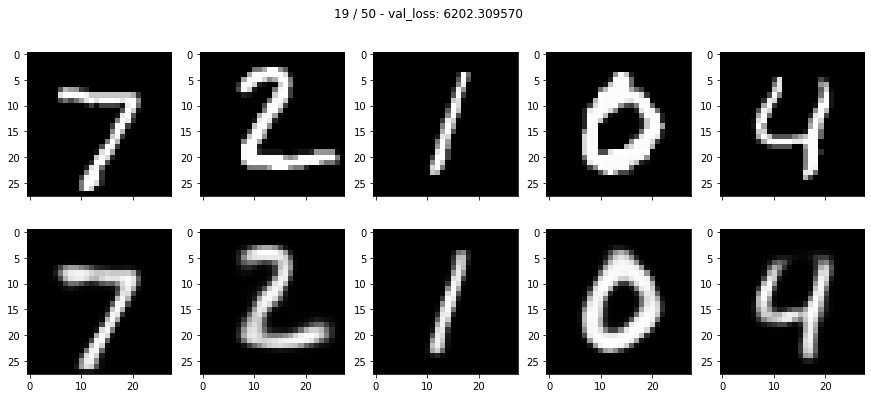

* Epoch 20/50
train loss: 6762.145996


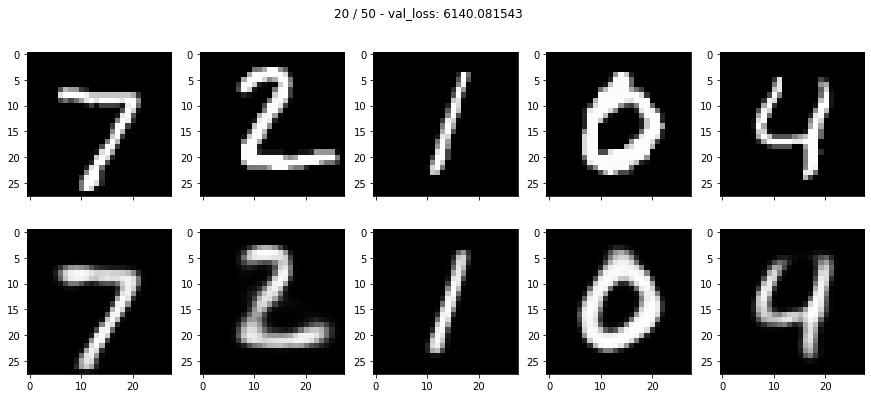

* Epoch 21/50
train loss: 6729.736328


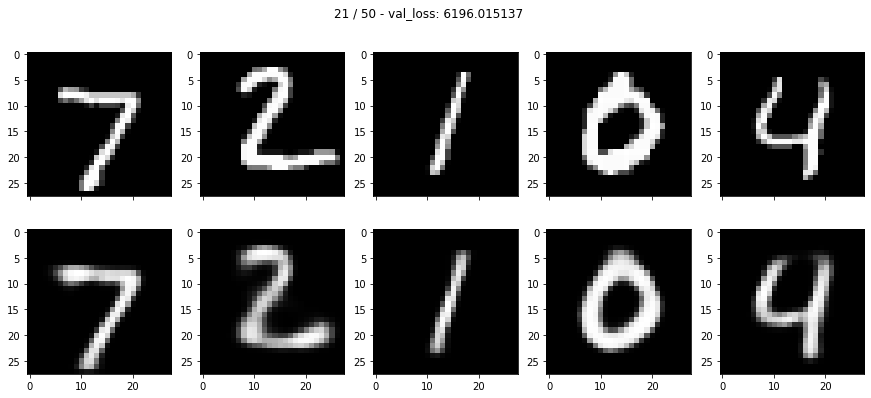

* Epoch 22/50
train loss: 6701.166992


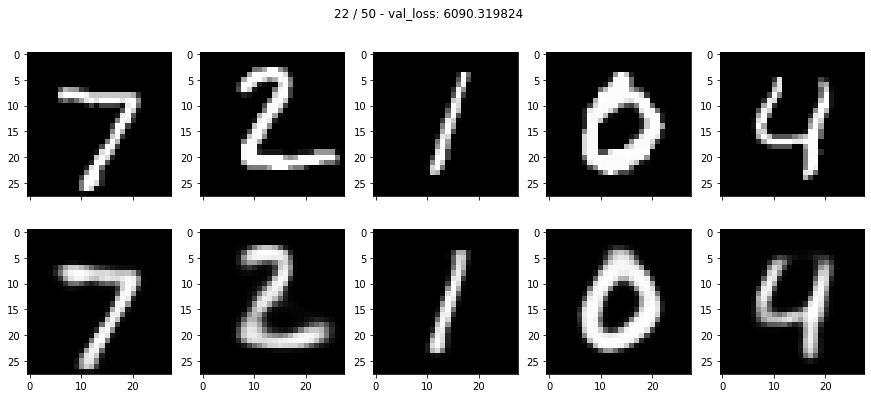

* Epoch 23/50
train loss: 6692.139160


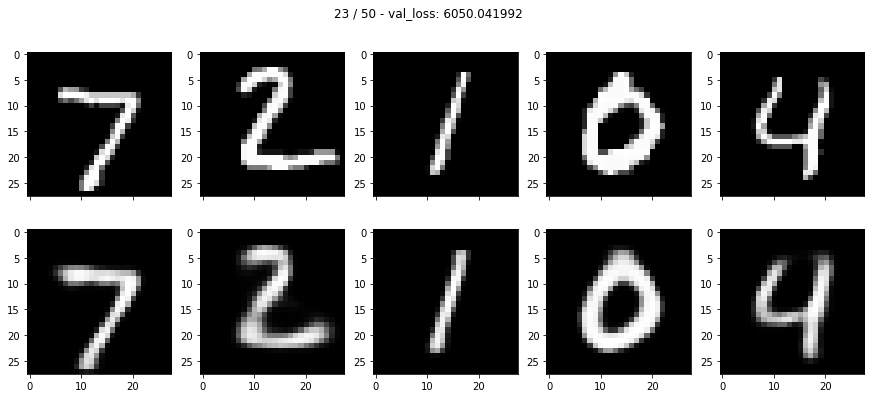

* Epoch 24/50
train loss: 6676.020996


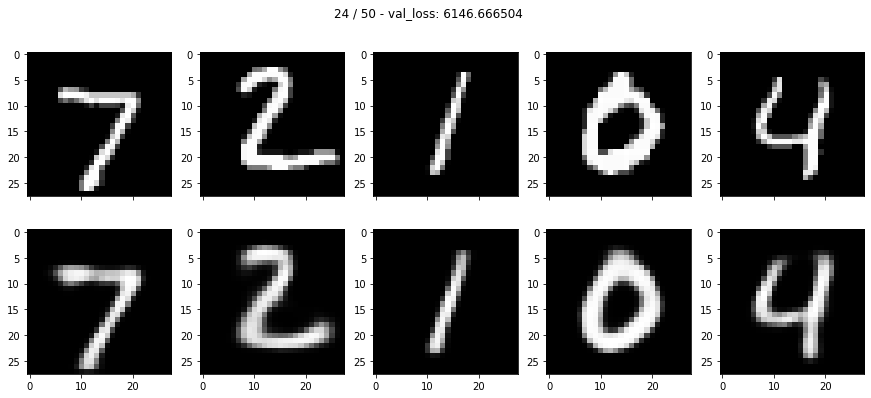

* Epoch 25/50
train loss: 6634.655273


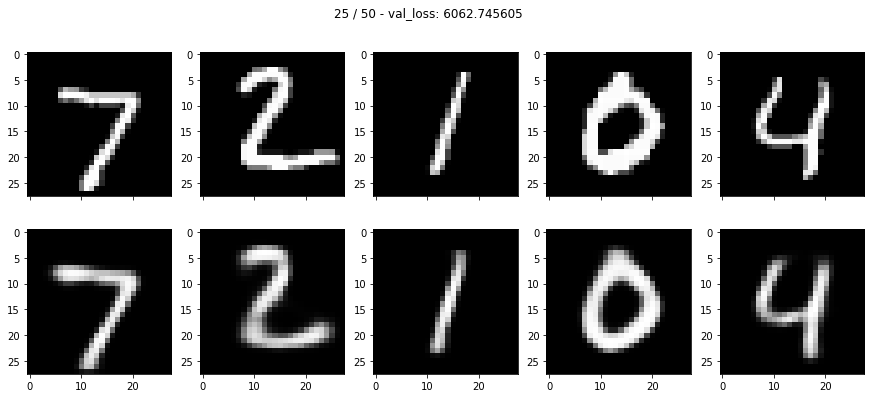

* Epoch 26/50
train loss: 6637.770020


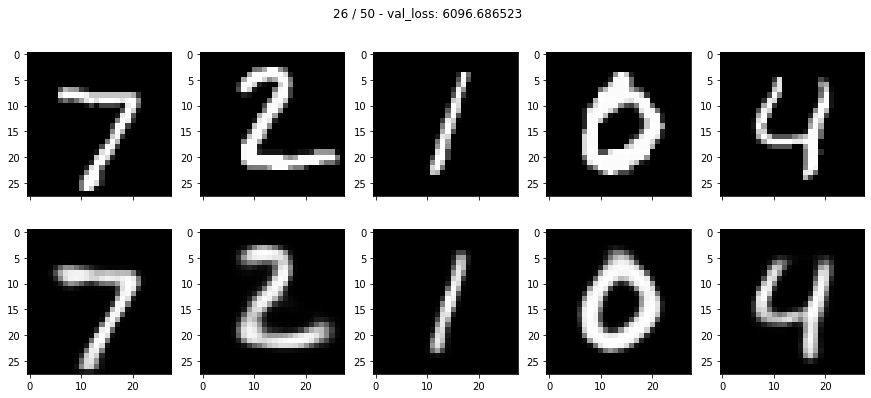

* Epoch 27/50
train loss: 6624.723633


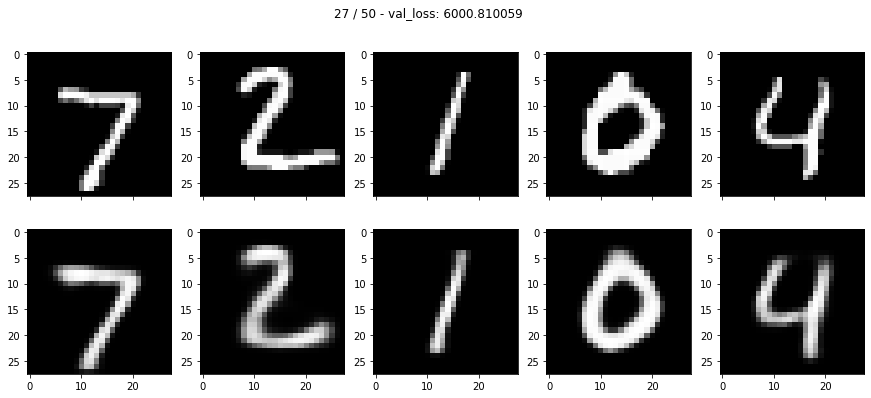

* Epoch 28/50
train loss: 6611.469238


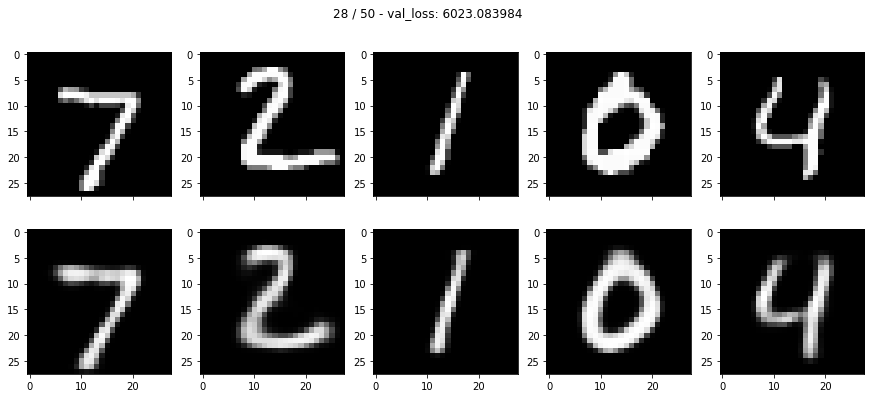

* Epoch 29/50
train loss: 6597.198242


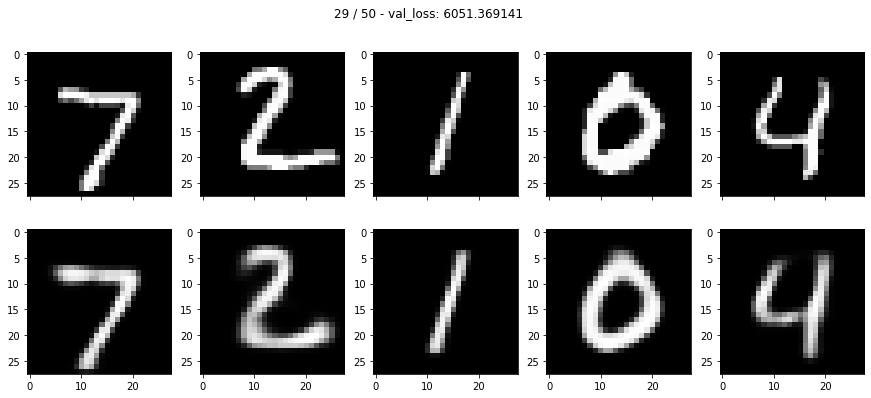

* Epoch 30/50
train loss: 6577.487793


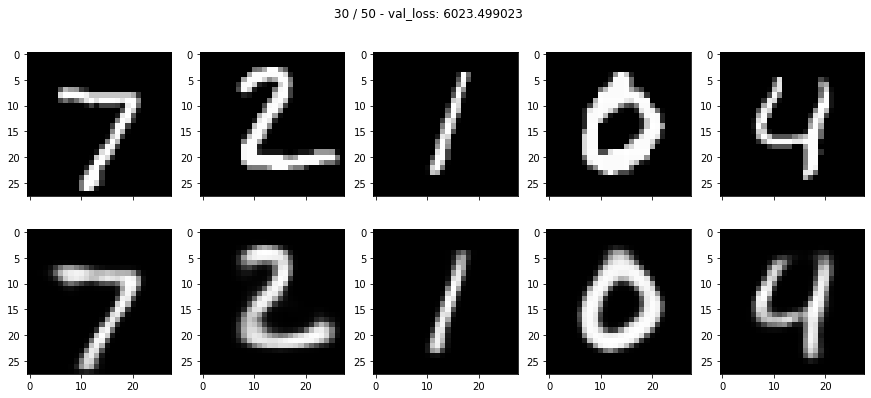

* Epoch 31/50
train loss: 6561.317871


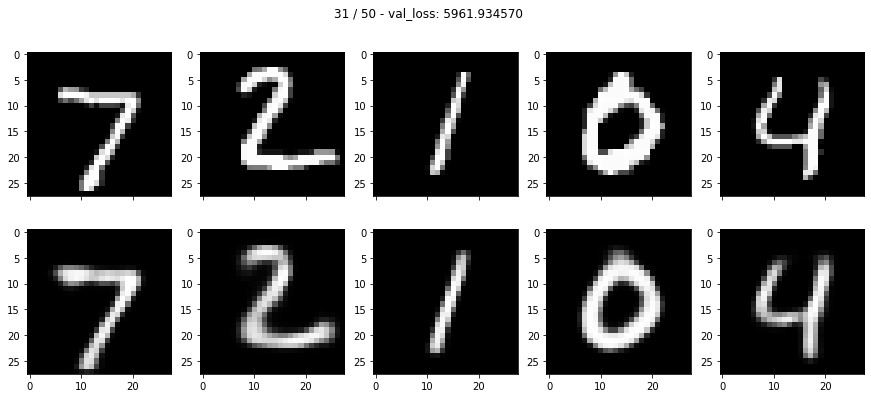

* Epoch 32/50
train loss: 6566.982910


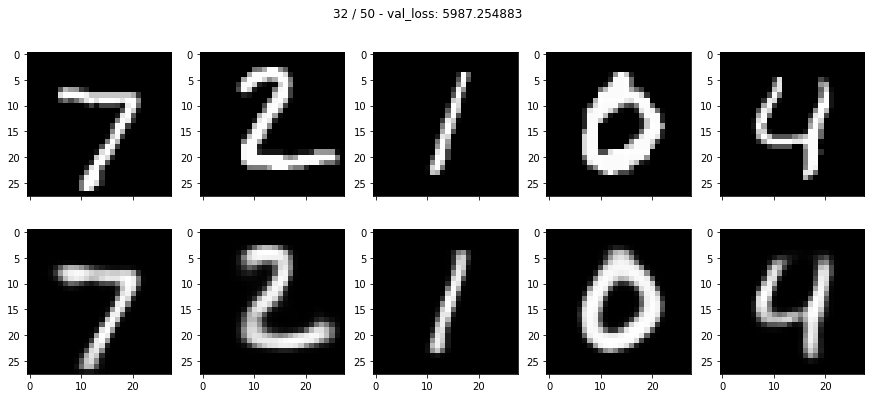

* Epoch 33/50
train loss: 6538.993164


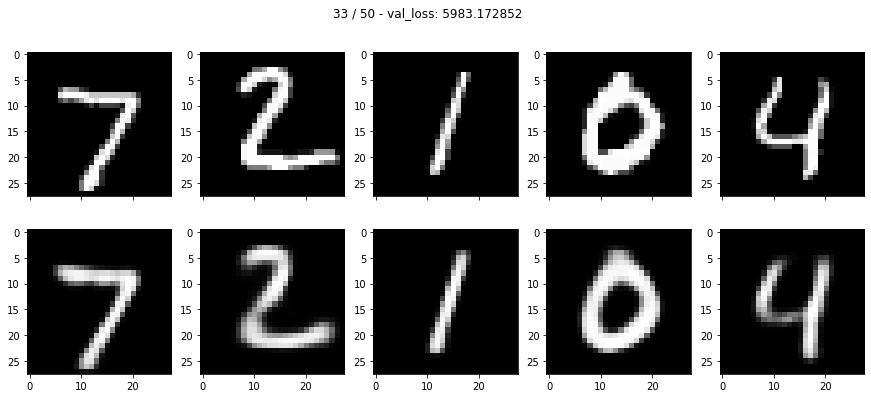

* Epoch 34/50
train loss: 6530.558594


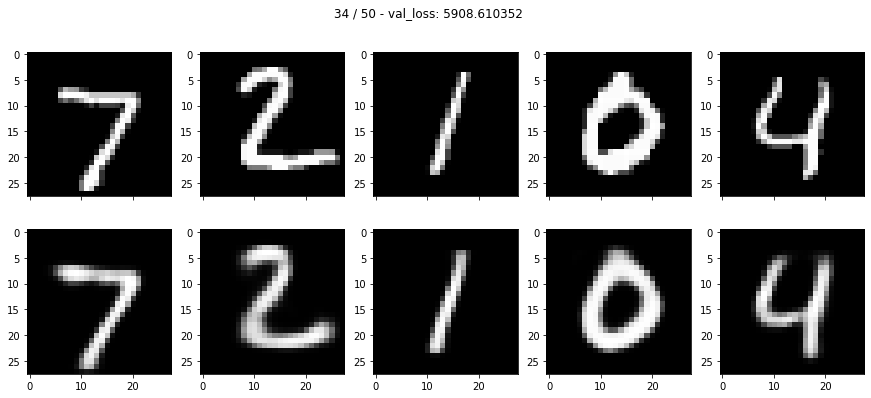

* Epoch 35/50
train loss: 6514.831055


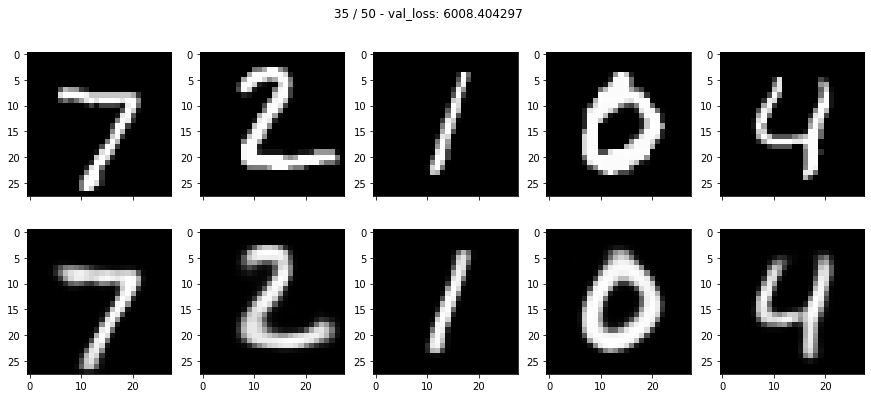

* Epoch 36/50
train loss: 6515.314453


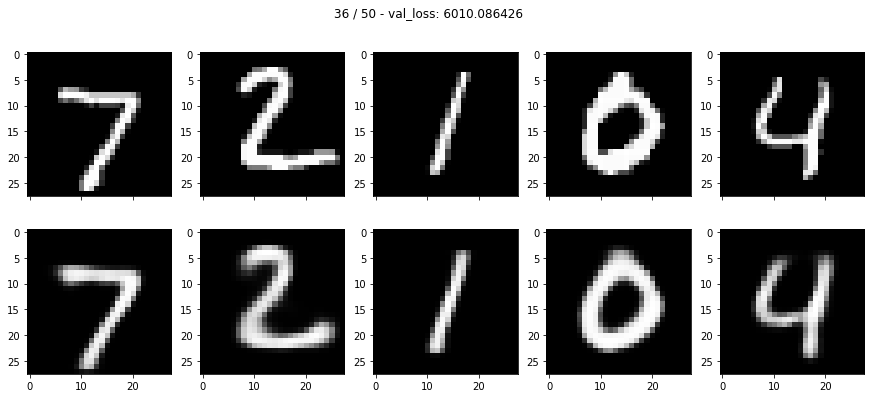

* Epoch 37/50
train loss: 6505.750977


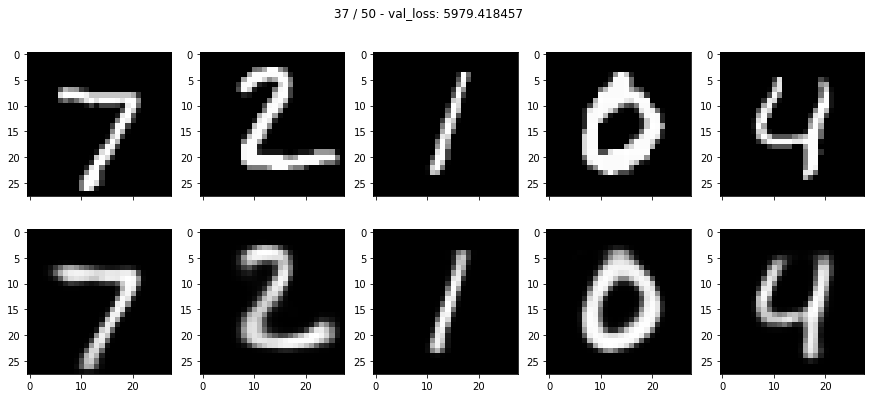

* Epoch 38/50
train loss: 6484.207031


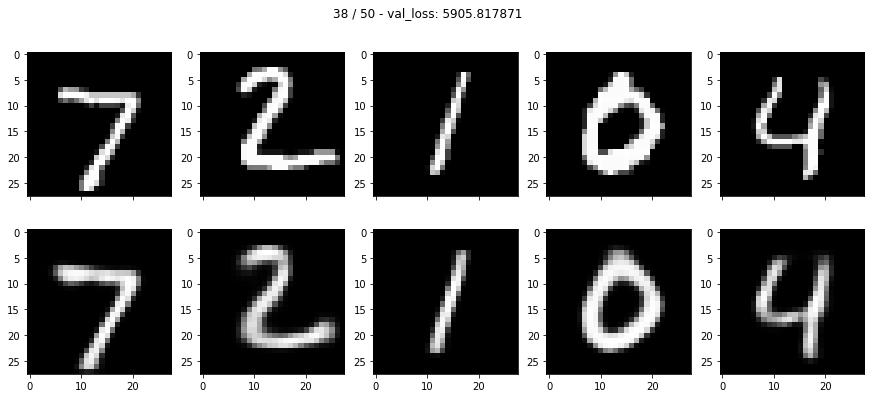

* Epoch 39/50
train loss: 6501.222168


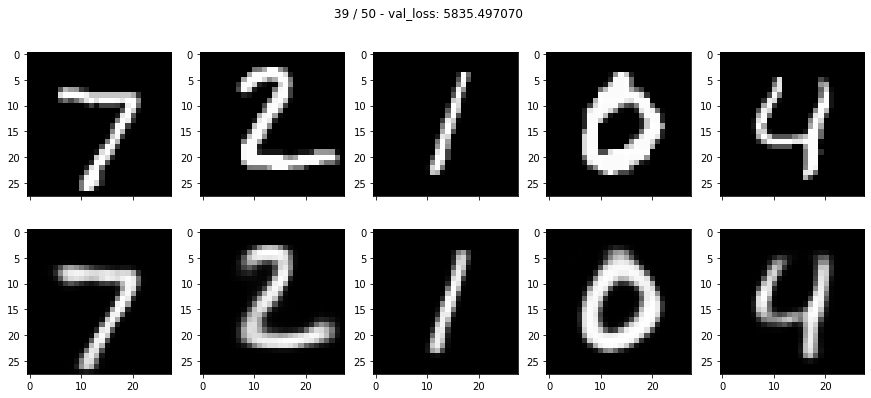

* Epoch 40/50
train loss: 6480.564453


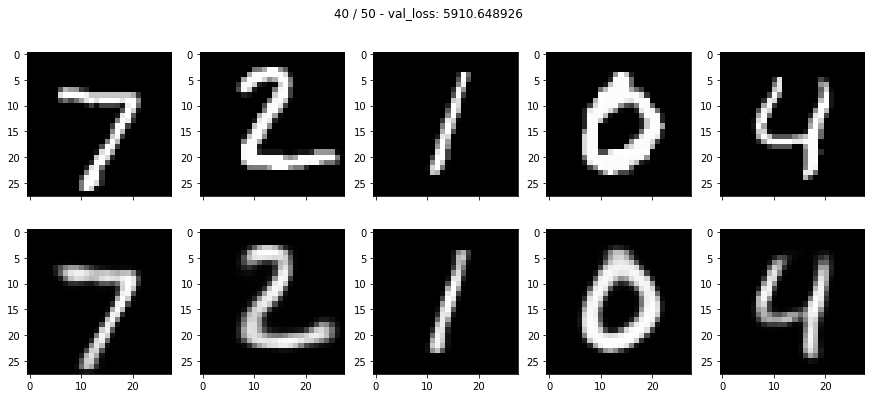

* Epoch 41/50
train loss: 6472.697754


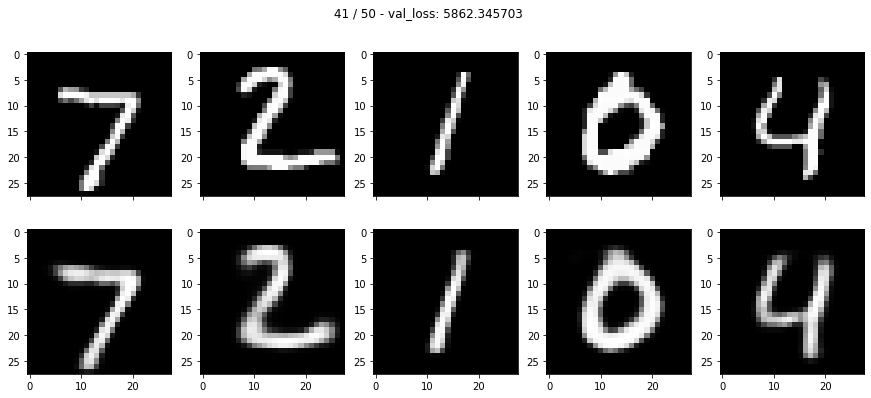

* Epoch 42/50
train loss: 6472.783203


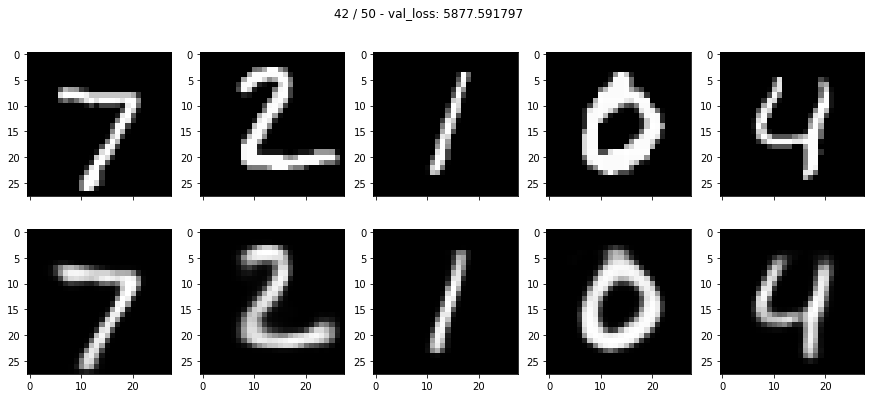

* Epoch 43/50
train loss: 6448.144043


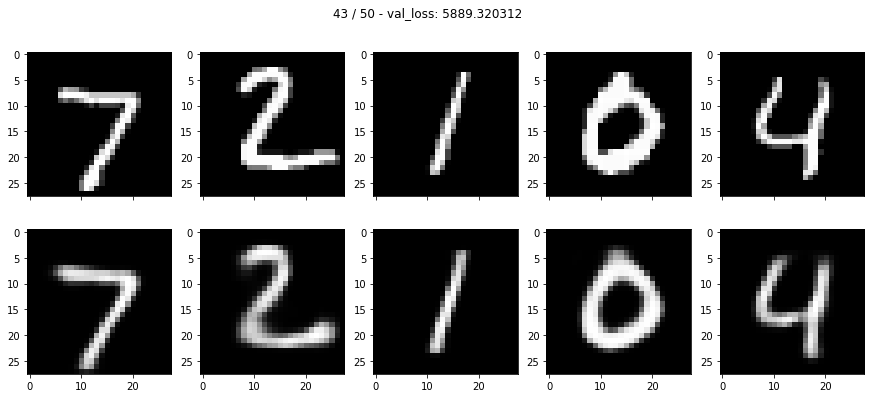

* Epoch 44/50
train loss: 6449.770508


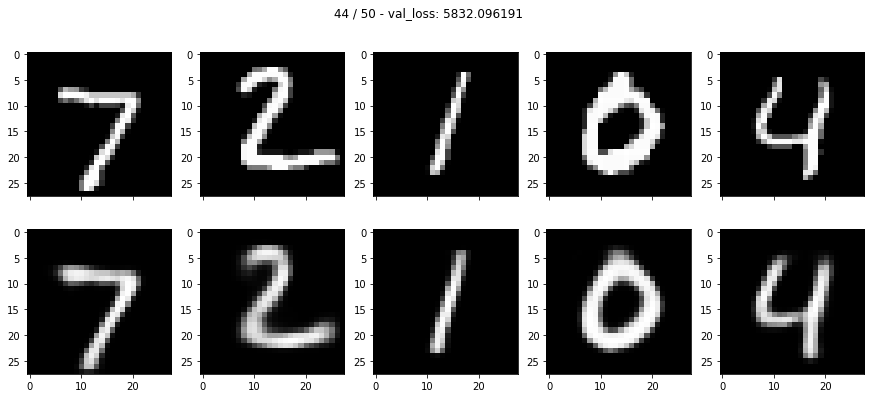

* Epoch 45/50
train loss: 6453.255859


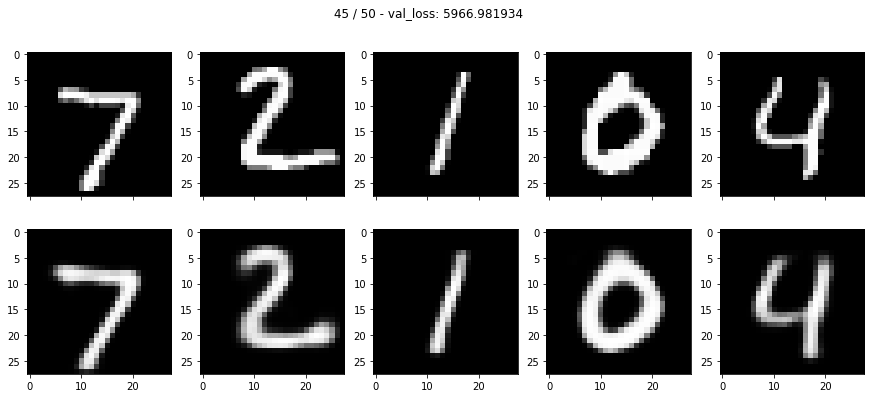

* Epoch 46/50
train loss: 6428.688477


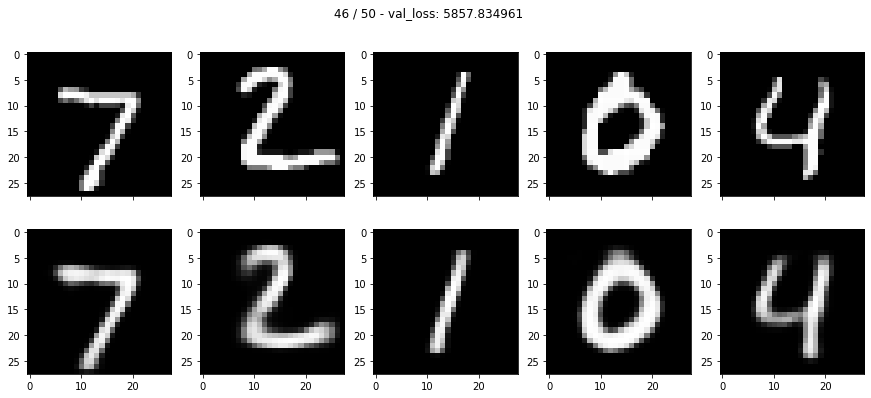

* Epoch 47/50
train loss: 6432.704102


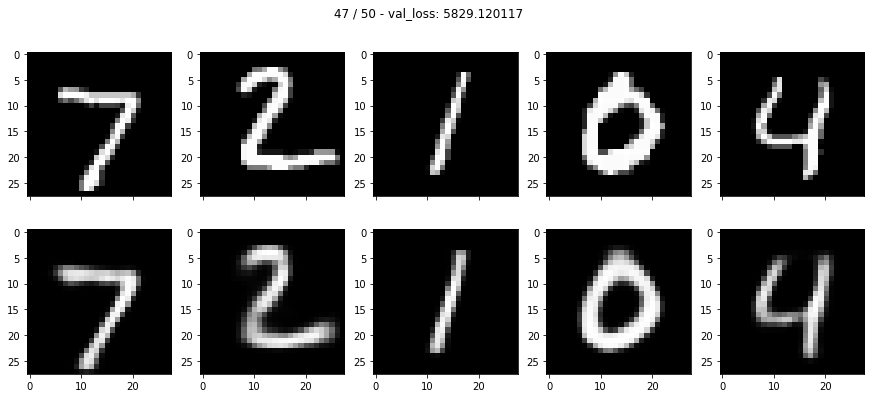

* Epoch 48/50
train loss: 6423.305176


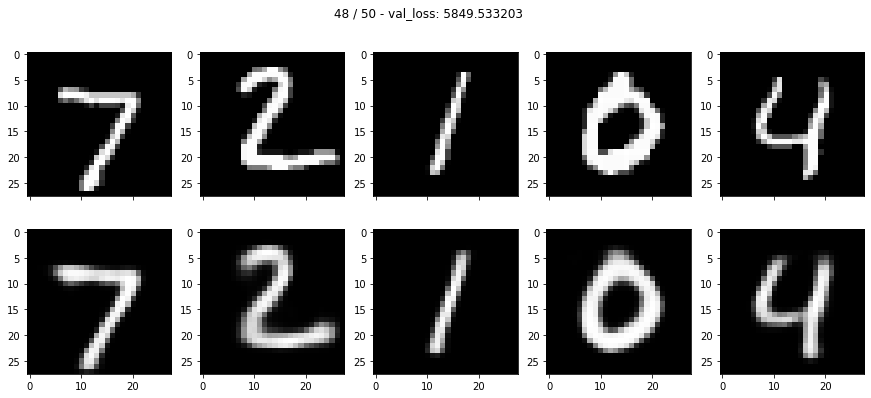

* Epoch 49/50
train loss: 6416.322266


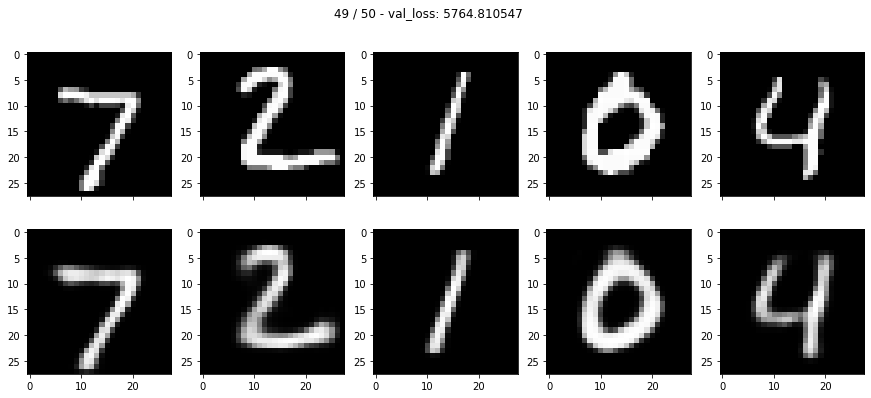

* Epoch 50/50
train loss: 6408.712891


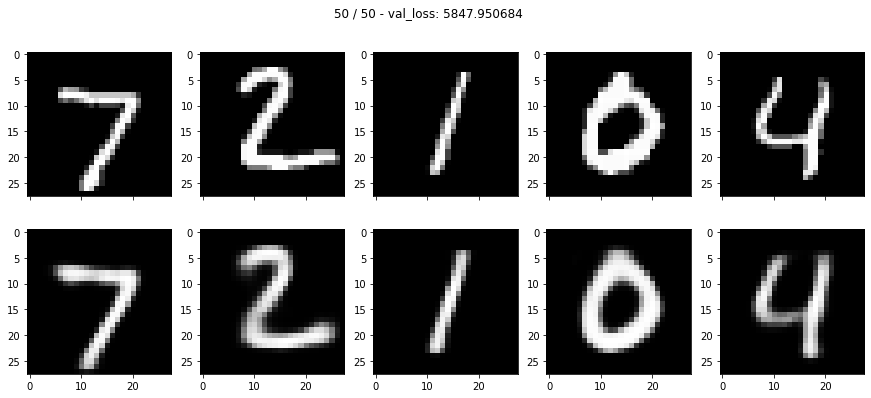

No handles with labels found to put in legend.


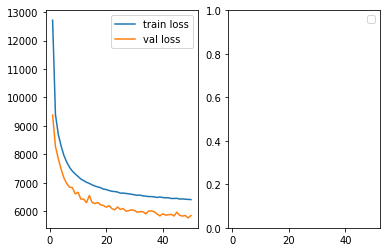

In [ ]:
cvae_train(autoencoder, optimizer, scheduler, 50, criterion, train_loader, test_loader)

### Sampling


Тут мы будем сэмплировать из CVAE. Это прикольнее, чем сэмплировать из простого AE/VAE: тут можно взять один и тот же латентный вектор и попросить CVAE восстановить из него картинки разных классов!
Для MNIST вы можете попросить CVAE восстановить из одного латентного вектора, например, картинки цифры 5 и 7.

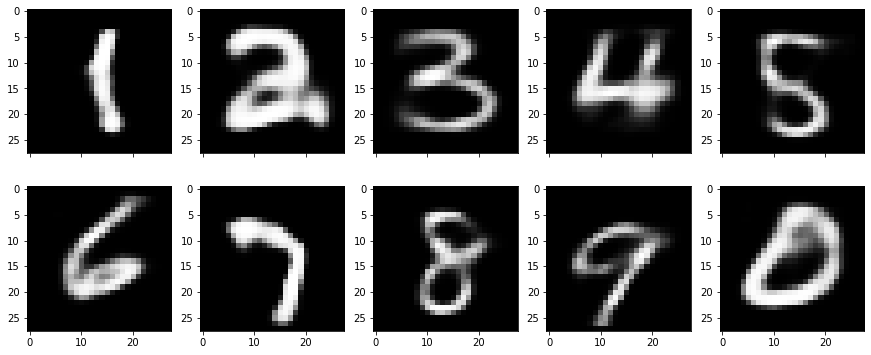

In [ ]:
z = np.array([np.random.normal(0, 1, features) for i in range(10)])
y = torch.Tensor([1,2,3,4,5,6,7,8,9,0])

with torch.set_grad_enabled(False):
    output = autoencoder.decode(torch.Tensor(z).to(device),y.to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    ax[0][j].imshow(output[j].squeeze().cpu(), cmap ='gray')

for j in range(5):
    ax[1][j].imshow(output[j+5].cpu().squeeze(), cmap = 'gray')
plt.show()   

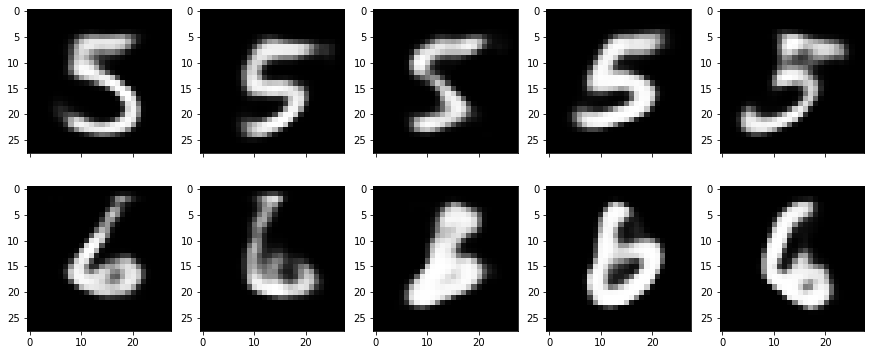

In [ ]:
z = np.array([np.random.normal(0, 1, features) for i in range(10)])
y = torch.Tensor([5,5,5,5,5,6,6,6,6,6])

with torch.set_grad_enabled(False):
    output = autoencoder.decode(torch.Tensor(z).to(device),y.to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    ax[0][j].imshow(output[j].squeeze().cpu(), cmap ='gray')

for j in range(5):
    ax[1][j].imshow(output[j+5].cpu().squeeze(), cmap = 'gray')
plt.show() 

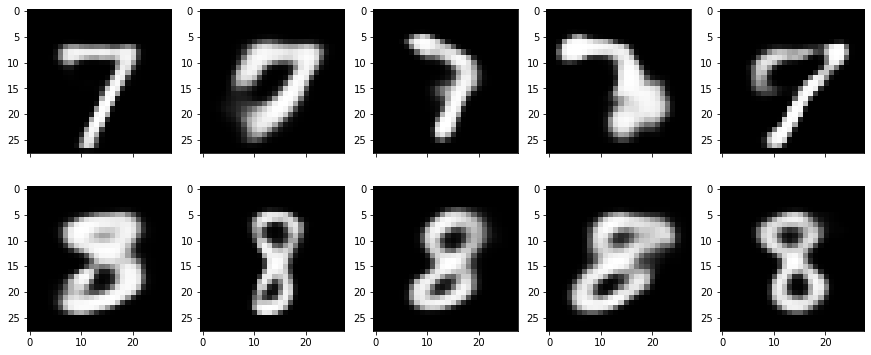

In [ ]:
z = np.array([np.random.normal(0, 1, features) for i in range(10)])
y = torch.Tensor([7,7,7,7,7,8,8,8,8,8])

with torch.set_grad_enabled(False):
    output = autoencoder.decode(torch.Tensor(z).to(device),y.to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    ax[0][j].imshow(output[j].squeeze().cpu(), cmap ='gray')

for j in range(5):
    ax[1][j].imshow(output[j+5].cpu().squeeze(), cmap = 'gray')
plt.show() 

Сгенерируем разные цифры из одного вектора

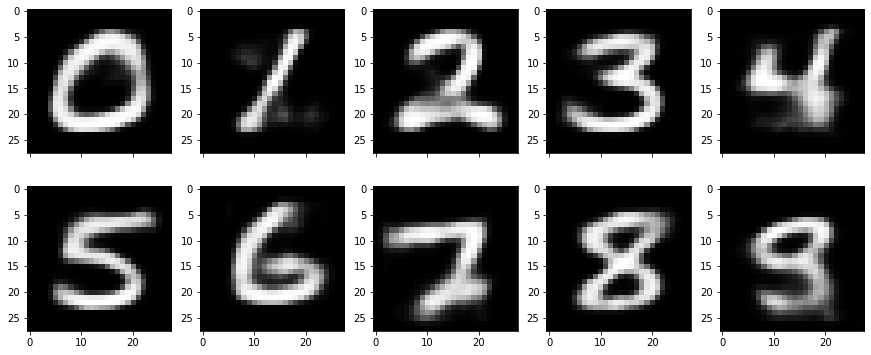

In [ ]:
z = np.array([np.random.normal(0, 1, features) for i in range(10)])
for i in range(10):
    z[i] = z[0]
y = torch.Tensor([0,1,2,3,4,5,6,7,8,9])

autoencoder.eval()
with torch.set_grad_enabled(False):
    output = autoencoder.decode(torch.Tensor(z).to(device),y.to(device))

fig, ax = plt.subplots(2,5, figsize = (15, 6), sharex = True)
for j in range(5):
    ax[0][j].imshow(output[j].squeeze().cpu(), cmap ='gray')

for j in range(5):
    ax[1][j].imshow(output[j+5].cpu().squeeze(), cmap = 'gray')
plt.show() 

In [ ]:
from sklearn.manifold import TSNE


tl = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=10000, shuffle=True)

Splendid! Вы великолепны!


### Latent Representations

Давайте посмотрим, как выглядит латентное пространство картинок в CVAE и сравним с картинкой для VAE =)

Опять же, нужно покрасить точки в разные цвета в зависимости от класса.

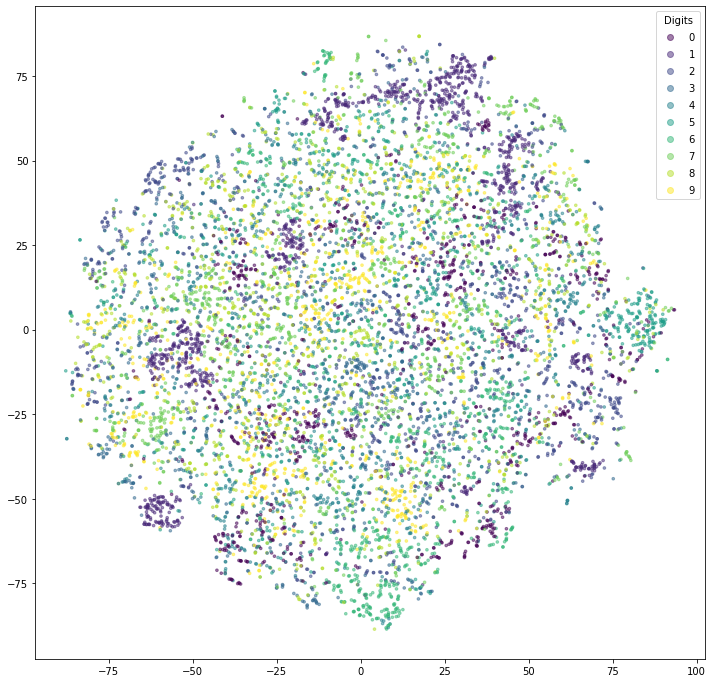

In [ ]:
x_val, y_val = next(iter(tl))
numbers = random.sample(range(0,len(x_val)), len(x_val))
x_val = x_val[numbers]
y_val = y_val[numbers]

autoencoder.eval()
with torch.set_grad_enabled(False): 
    val_mu, val_logsigma, val_reconstruction = autoencoder(x_val.to(device), y_val.to(device))

vector_2d = TSNE().fit_transform(val_mu.cpu())
vector_2d.shape
plt.figure(figsize=(12,12))
scatter = plt.scatter(vector_2d[:,0], vector_2d[:,1], c = y_val, label = y_val, alpha = 0.5, s = 7)
legend = plt.legend(*scatter.legend_elements(),loc = 'upper right', title ='Digits')

plt.show()

Что вы думаете насчет этой картинки? Отличается от картинки для VAE?

Определенно отличается, здесь уже не наблюдается деление на кучки собранные

К сожалению бонус не успеваю сделать(

# BONUS 1: Denoising

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

У автоэнкодеров, кроме сжатия и генерации изображений, есть другие практические применения. Про одно из них эта бонусная часть задания.

Автоэнкодеры могут быть использованы для избавления от шума на фотографиях (denoising). Для этого их нужно обучить специальным образом: input картинка будет зашумленной, а выдавать автоэнкодер должен будет картинку без шума. 
То есть, loss-функция AE останется той же (MSE между реальной картинкой и выданной), а на вход автоэнкодеру будет подаваться зашумленная картинка.

<a href="https://ibb.co/YbRJ1nZ"><img src="https://i.ibb.co/0QD164t/Screen-Shot-2020-06-04-at-4-49-50-PM.png" alt="Screen-Shot-2020-06-04-at-4-49-50-PM" border="0"></a>

Для этого нужно взять ваш любимый датасет (датасет лиц из первой части этого задания или любой другой) и сделать копию этого датасета с шумом. 

В питоне шум можно добавить так:

In [ ]:
noise_factor = 0.5
X_noisy = X + noise_factor * np.random.normal(loc=0.0, scale=1.0, size=X.shape) 

In [ ]:
<тут ваш код обучения автоэнкодера на зашумленных картинках. Не забудтье разбить на train/test!>

In [ ]:
<тут проверка, как AE убирает щум с тестовых картинок. Надеюсь, все получилось =)>

# BONUS 2: Image Retrieval

## Внимание! За бонусы доп. баллы не ставятся, но вы можете сделать их для себя.

Давайте представим, что весь наш тренировочный датасет -- это большая база данных людей. И вот мы получили картинку лица какого-то человека с уличной камеры наблюдения (у нас это картинка из тестового датасета) и хотим понять, что это за человек. Что нам делать? Правильно -- берем наш VAE, кодируем картинку в латентное представление и ищем среди латентныз представлений лиц нашей базы самые ближайшие!

План:

1. Получаем латентные представления всех лиц тренировочного датасета
2. Обучаем на них LSHForest `(sklearn.neighbors.LSHForest)`, например, с `n_estimators=50`
3. Берем картинку из тестового датасета, с помощью VAE получаем ее латентный вектор
4. Ищем с помощью обученного LSHForest ближайшие из латентных представлений тренировочной базы
5. Находим лица тренировочного датасета, которым соответствуют ближайшие латентные представления, визуализируем!

Немного кода вам в помощь: (feel free to delete everything and write your own)

In [ ]:
codes = <поучите латентные представления картинок из трейна>

In [ ]:
# обучаем LSHForest
from sklearn.neighbors import LSHForest
lshf = LSHForest(n_estimators=50).fit(codes)

In [ ]:
def get_similar(image, n_neighbors=5):
  # функция, которая берет тестовый image и с помощью метода kneighbours у LSHForest ищет ближайшие векторы
  # прогоняет векторы через декодер и получает картинки ближайших людей

  code = <получение латентного представления image>
    
  (distances,),(idx,) = lshf.kneighbors(code, n_neighbors=n_neighbors)

  return distances, X_train[idx]

In [ ]:
def show_similar(image):

  # функция, которая принимает тестовый image, ищет ближайшие к нему и визуализирует результат
    
    distances,neighbors = get_similar(image,n_neighbors=11)
    
    plt.figure(figsize=[8,6])
    plt.subplot(3,4,1)
    plt.imshow(image.cpu().numpy().transpose([1,2,0]))
    plt.title("Original image")
    
    for i in range(11):
        plt.subplot(3,4,i+2)
        plt.imshow(neighbors[i].cpu().numpy().transpose([1,2,0]))
        plt.title("Dist=%.3f"%distances[i])
    plt.show()

In [ ]:
<тут выведите самые похожие лица к какому-нибудь лицу из тестовой части датасета>